In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn

In [2]:
from pathlib import Path

In [3]:
plt.rcParams["figure.dpi"] = 200
plt.rcParams["figure.facecolor"] = "white"

In [4]:
from plotting.settings import *

In [5]:
from plotting.palettes import neuronal_palette

In [6]:
from plotting.plot_funcs import marker_violins, scatter_2by2

In [7]:
from itertools import zip_longest
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx
    args = [iter(iterable)] * n
    return zip_longest(fillvalue=fillvalue, *args)

In [8]:
def plot_side_by_side(original, subclust, orig_key="cluster_revised", sub_key="cluster", size=40):
    fig, axs = plt.subplots(1, 3, figsize=(14, 4), gridspec_kw={"wspace":0.5})

    groups = sorted(subclust.obs["original_cluster"].unique())
    orig_cats = original.obs[orig_key].cat.categories
    palette = [c for k, c in enumerate(neuronal_palette) if orig_cats[k] in groups]
    sc.pl.umap(
        original, groups=groups,
        color=orig_key, show=False, ax=axs[0], 
        palette=neuronal_palette
    )
    axs[0].set_title("Global clustering")
    sc.pl.umap(
        subclust, 
        color="original_cluster", show=False, ax=axs[1],
        size=size,
        palette=palette
    )
    axs[1].set_title("Global cluster distribution")
    sc.pl.umap(subclust, color=sub_key, show=False, ax=axs[2], size=size)
    axs[2].set_title("Subclustering")
    fig.subplots_adjust(left=0.04)
    return fig

In [9]:
from plotting.plot_funcs import get_heatmap_data, fix_heatmap_annotations, fix_heatmap_colorbar, heatmap_cmap

In [10]:
from utils.load_data import save_figure

In [11]:
def get_marker_dataframe(adata, marker_key="auroc_markers"):
    return pd.DataFrame.from_dict(adata.uns[marker_key])

In [12]:
def plot_heatmap(adata, name, cluster_key="cluster"):
    markers = get_marker_dataframe(adata)
    markers.AUROC += 0.15
    
    n_clusters = len(adata.obs[cluster_key].cat.categories)
    palette = adata.uns[f"{cluster_key}_colors"]
    #palette, k = ("tab10", 10) if n_clusters <= 10 else ("tab20", 20)
    #palette = seaborn.mpl_palette(palette, k)

    heatmap_data, col_colors, row_colors = get_heatmap_data(
        adata, markers, cluster_key, palette
    )
    
    cg = seaborn.clustermap(
        heatmap_data, z_score=0, vmin=-3, vmax=3, cmap=heatmap_cmap,
        xticklabels=False, yticklabels=False, row_cluster=False, col_cluster=False,
        row_colors=row_colors, col_colors=col_colors,
        robust=True, figsize=(4, 4),
        cbar_kws=dict(use_gridspec=True)
    )
    cg.ax_row_colors.set_ylabel("Genes", size="small")
    cg.ax_col_colors.set_title(f"{name} - Cells", size="small", zorder=100)
    fix_heatmap_colorbar(cg, adata, heatmap_data, heatmap_cmap)

    cg.ax_col_colors.xaxis.tick_top()
    fix_heatmap_annotations(cg)
    cg.fig.subplots_adjust(bottom=0.1)
    save_heatmap(cg, "revision", f"{adata.uns['sampleid']}_heatmap-v1", dpi=600, ext="png")
    return cg

In [13]:
from sklearn import metrics
from scipy.stats import wilcoxon
def logmean(x, axis=0):
    return np.log1p(np.mean(x, axis=axis))

def logmeanexp(x, axis=0):
    return np.log1p(np.mean(np.expm1(x), axis=axis))

def xflatten(x):
    return np.asarray(x).flatten()
def find_marker_genes(adata, cluster_key="cluster", log_fold_change=1.0):
    clusters = adata.obs[cluster_key].cat.categories

    auc_scores = []
    for cluster in clusters:
        print(cluster, end=" ")
        inds = adata.obs[cluster_key] == cluster

        group = adata.raw[inds, :]
        rest = adata.raw[~inds, :]

        group_mean = xflatten(logmean(group.X, axis=0))
        rest_mean = xflatten(logmean(rest.X, axis=0))
        diff = abs(group_mean - rest_mean)
        gene_inds = np.where(diff > log_fold_change)[0]

        truth = inds.astype(int).values
        scores = []
        for gene_ind in gene_inds:
            pred = xflatten(adata.raw.X[:, gene_ind].todense())
            scores.append(metrics.roc_auc_score(truth, pred))

        tmp = pd.DataFrame({
            "AUROC": scores,
            "gene_name": adata.raw.var_names[gene_inds],
            "avg_diff": diff[gene_inds],
            f"{cluster_key}": np.repeat([cluster], len(scores))
        })
        tmp = tmp.sort_values("AUROC", ascending=False)

        auc_scores.append(tmp)

    markers = pd.concat(auc_scores)
    markers = markers.reindex(columns=["gene_name", "AUROC", "avg_diff", cluster_key])
    markers = markers.reset_index(drop=True)
    #adata.uns["auroc_markers"] = markers.to_records(index=False)
    # recarrays with different dtypes don't play nice with h5 reading/writing
    # instead lets try just a column-based key:list dictionary
    adata.uns["auroc_markers"] = markers.to_dict(orient="list")

    return markers

In [14]:
from pathlib import Path
from datetime import datetime

CURRENT_DATE = datetime.now().strftime("%Y%m%d")
FIG_PATH = Path("..") / "figures" / CURRENT_DATE

def save_heatmap(cg, pdir, name, dpi=600, ext="pdf"):
    if not FIG_PATH.exists():
        FIG_PATH.mkdir(parents=True)

    out = FIG_PATH / pdir / f"{name}.{ext}"
    pout = FIG_PATH / pdir
    if not pout.exists():
        pout.mkdir()
    
    cg.savefig(out, dpi=dpi)
    print(f"Saved to {out.name}")

In [16]:
from plotting.palettes import red_colormap

Saved to blank_colorbar_with_ticks.pdf


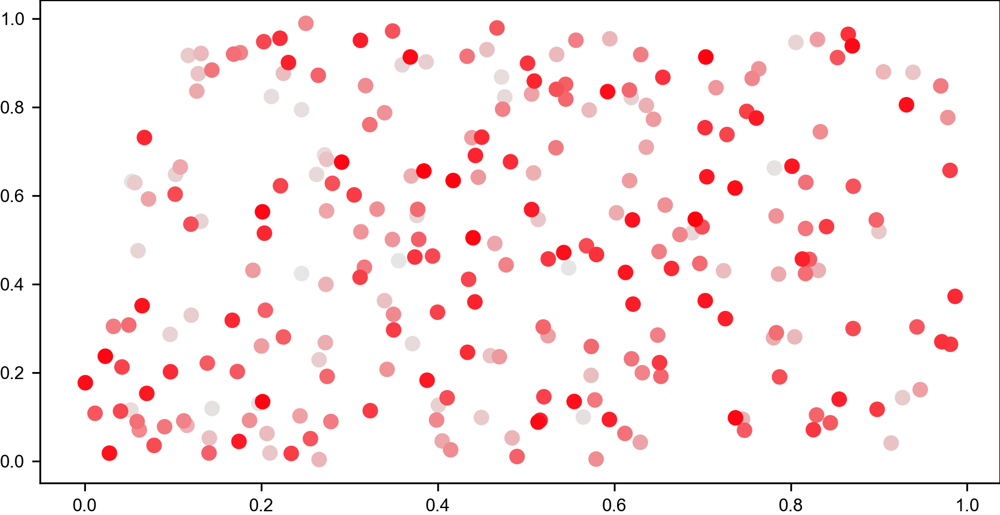

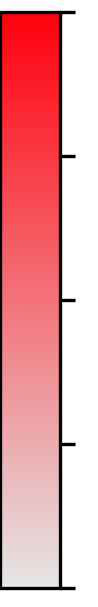

In [62]:
fig1, ax1 = plt.subplots()
mappable = ax1.scatter(*np.random.rand(2, 256), c=np.linspace(0, 1, 256), cmap=red_colormap);

fig, ax2 = plt.subplots(figsize=(0.25, 2))
cbar = fig.colorbar(mappable, cax=ax2)

cbar.set_ticks(np.linspace(0, 1, 5))
cbar.set_ticklabels([" "]*5)
fig.subplots_adjust(left=0.05, right=0.85, top=0.98, bottom=0.02)
save_figure(fig, "", "blank_colorbar_with_ticks")

Saved to blank_colorbar.pdf


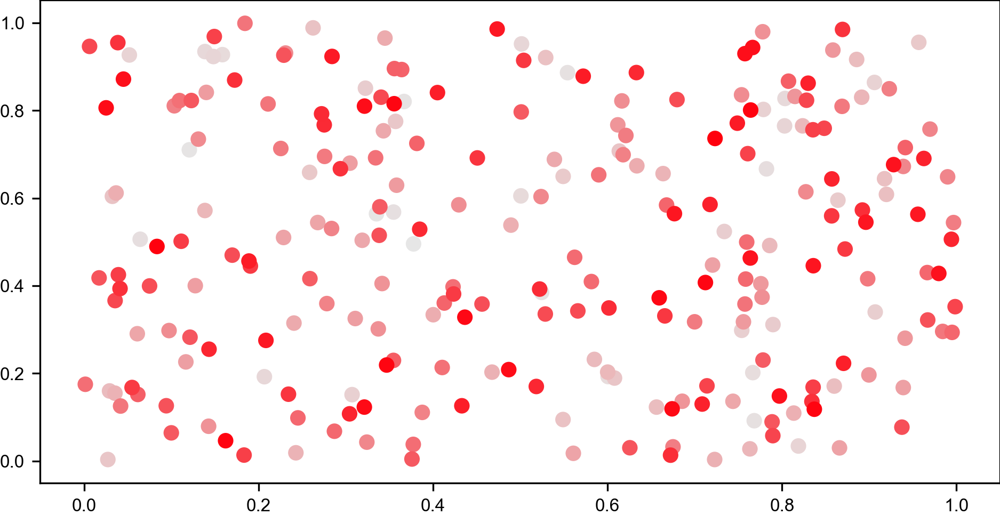

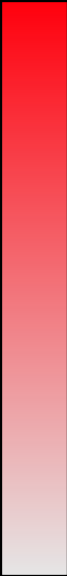

In [60]:
fig1, ax1 = plt.subplots()
mappable = ax1.scatter(*np.random.rand(2, 256), c=np.linspace(0, 1, 256), cmap=red_colormap);

fig, ax2 = plt.subplots(figsize=(0.25, 2))
cbar = fig.colorbar(mappable, cax=ax2)
cbar.set_ticks([])
fig.subplots_adjust(left=0.05, right=0.95, top=0.98, bottom=0.02)
save_figure(fig, "", "blank_colorbar")

## Load h5ads

In [16]:
neuronal_final = sc.read("../data/h5ad/neuronal-final.h5ad")

/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [17]:
neuronal_final.obs["cluster_revised"].cat.reorder_categories([str(k) for k in range(1, 21)], inplace=True)

In [18]:
sum_final = sc.read("../data/h5ad/glut8-subclustering.h5ad")
tmn_final = sc.read("../data/h5ad/aggr_tmn_like.h5ad")
lm_final = sc.read("../data/h5ad/aggr_lm.h5ad")
pmn_final = sc.read("../data/h5ad/aggr_pmn.h5ad")
arc_final = sc.read("../data/h5ad/aggr_arc.h5ad")
lha_final = sc.read("../data/h5ad/aggr_lha.h5ad")
mm_final = sc.read("../data/h5ad/aggr_mm.h5ad")
unknown_final = sc.read("../data/h5ad/aggr_unknowns.h5ad")

## PMv (7)

Saved to marker_umap_PMv-1.pdf
Saved to marker_umap_PMv-2.pdf
Saved to marker_umap_PMv-3.pdf
Saved to marker_violins_PMv.pdf


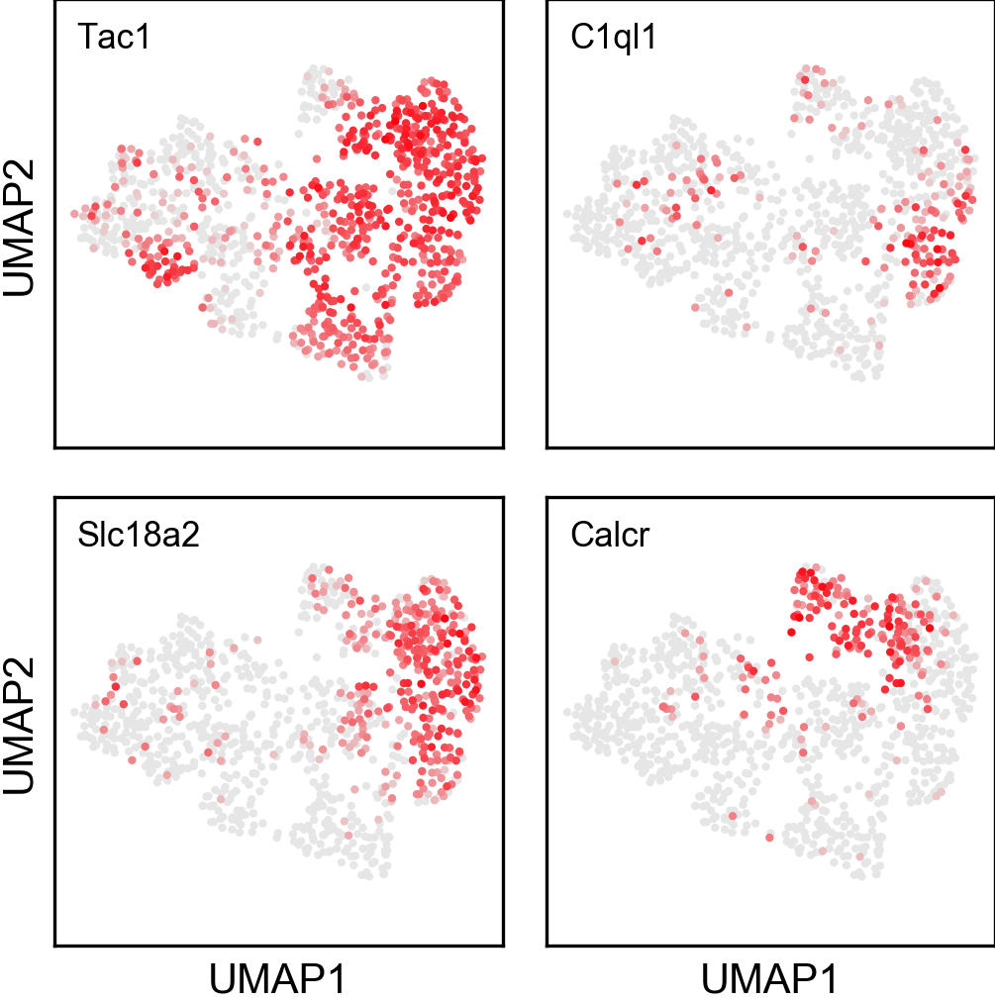

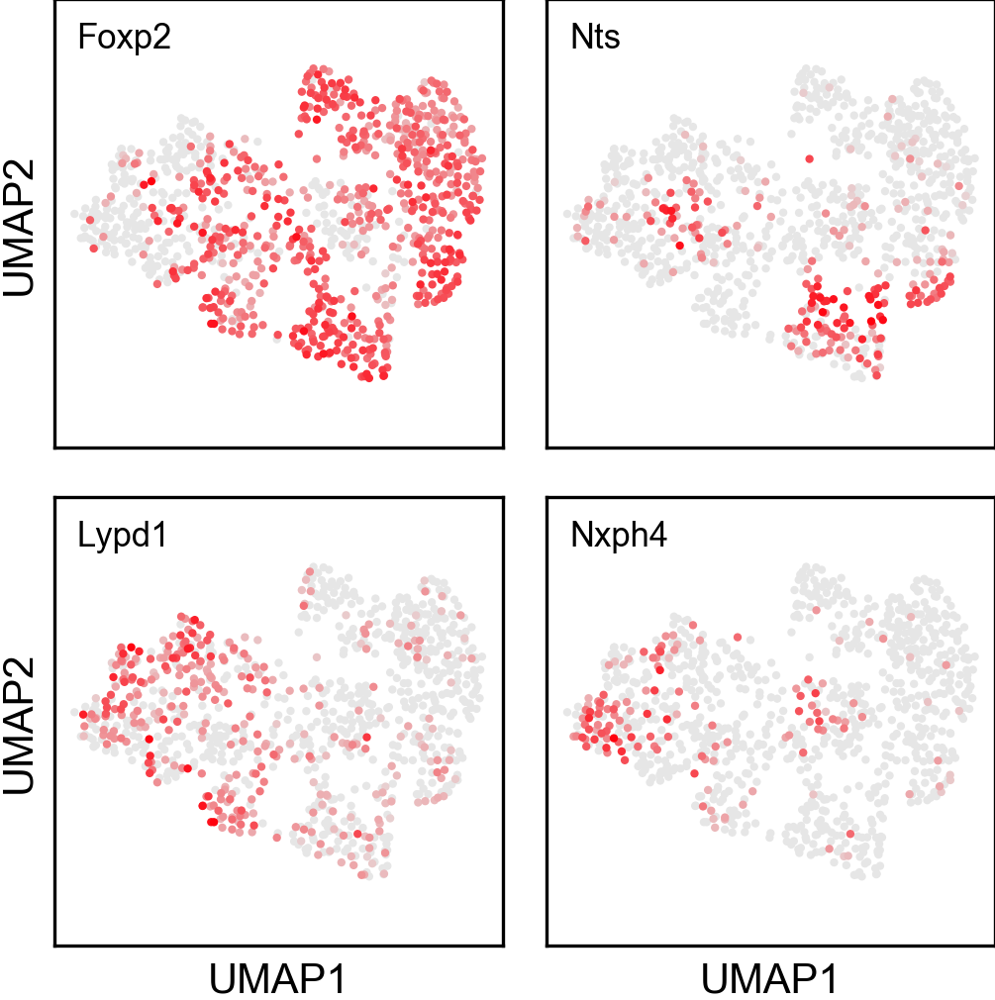

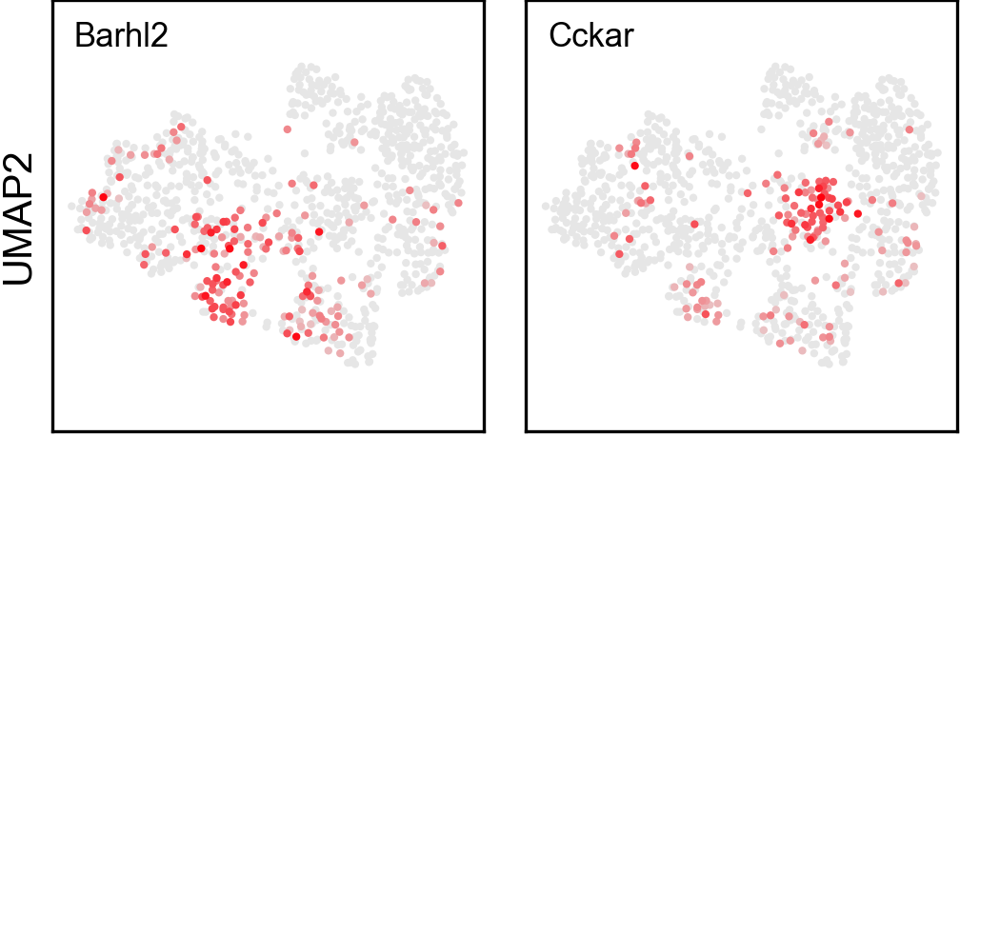

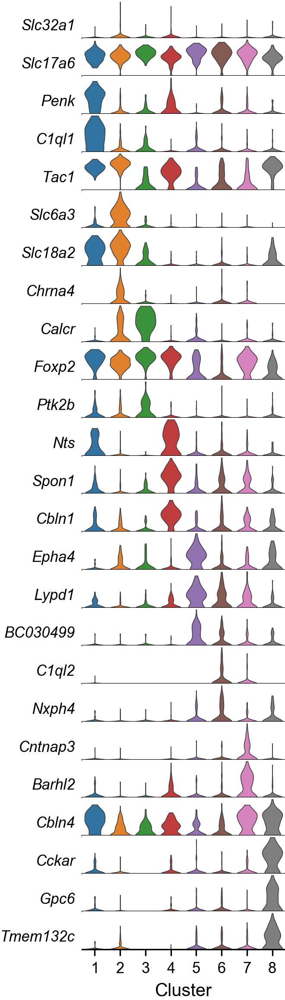

In [27]:
violin_genes = (
    "Slc32a1,Slc17a6,Penk,C1ql1,Tac1,Slc6a3,Slc18a2,Chrna4,Calcr,Foxp2,Ptk2b,Nts,Spon1,Cbln1,"
    "Epha4,Lypd1,BC030499,C1ql2,Nxph4,Cntnap3,Barhl2,Cbln4,Cckar,Gpc6,Tmem132c"
).split(",")
umap_genes = ("Tac1,C1ql1,Slc18a2,Calcr,Foxp2,Nts,Lypd1,Nxph4,Barhl2,Cckar").split(",")

adata = pmn_final
name = "PMv"
for k, genes in enumerate(grouper(umap_genes, 4), start=1):
    genes = list(filter(None, genes))
    scatter_2by2(
        adata, genes, figdir="revision", filename=f"marker_umap_{name}-{k}",
        markersize=16, add_marker_edges=False
)
marker_violins(
    adata, violin_genes, "cluster", adata.uns["cluster_colors"],
    filename=f"marker_violins_{name}", figdir="revision"
)

## ARC (14, 16, 18)

Saved to marker_umap_ARC-1.pdf
Saved to marker_umap_ARC-2.pdf
Saved to marker_umap_ARC-3.pdf
Saved to marker_umap_ARC-4.pdf
Saved to marker_violins_ARC.pdf


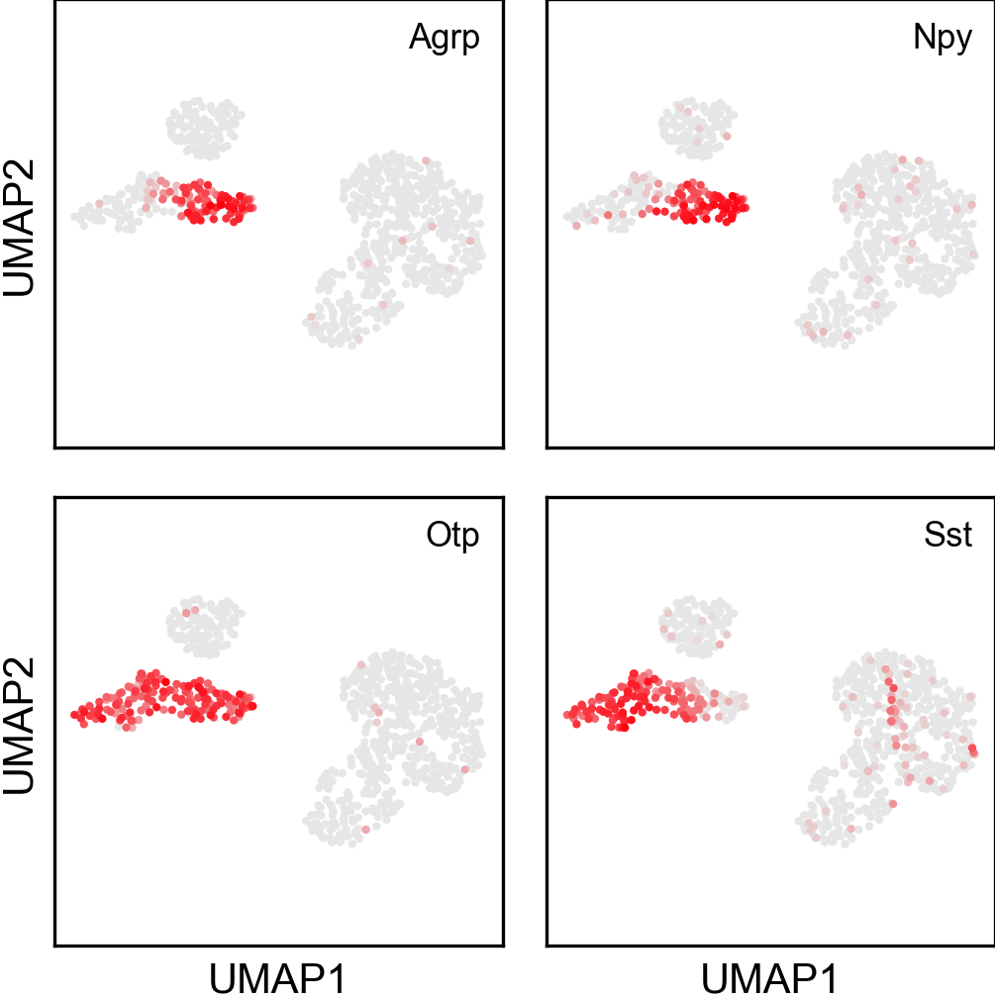

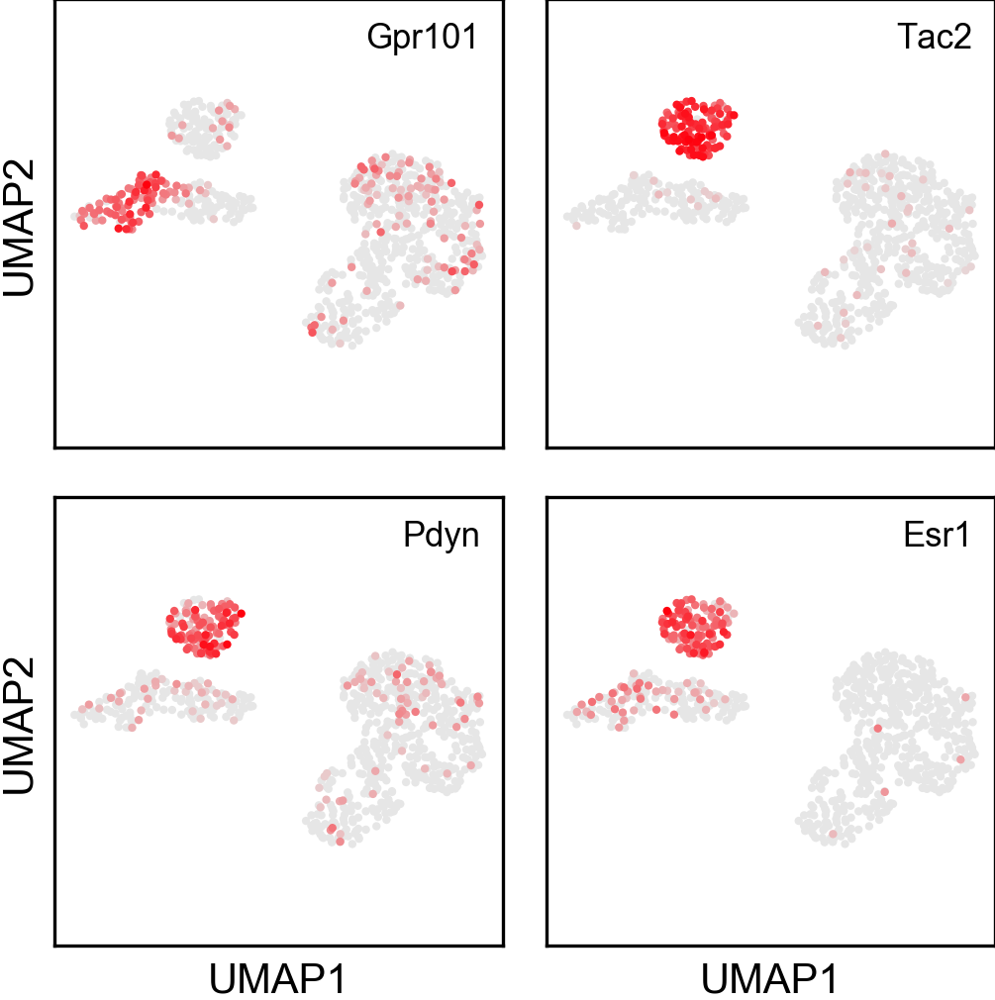

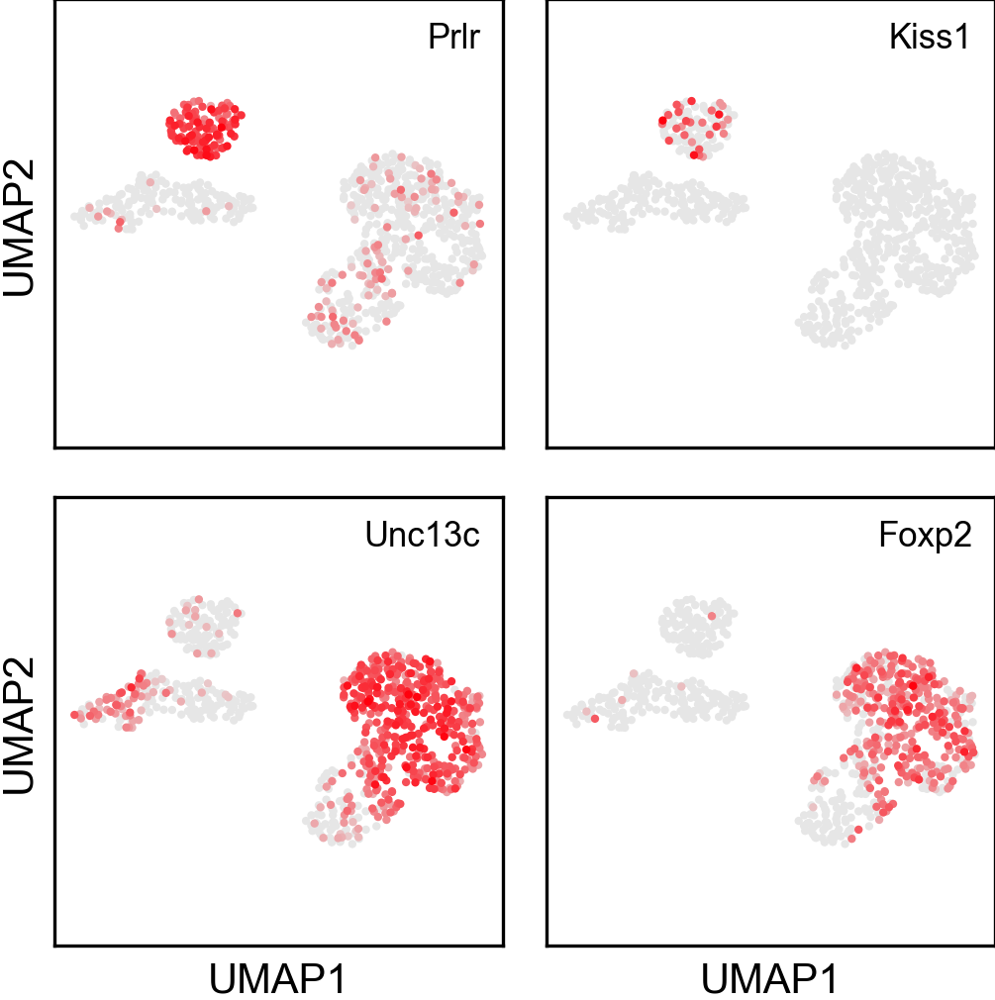

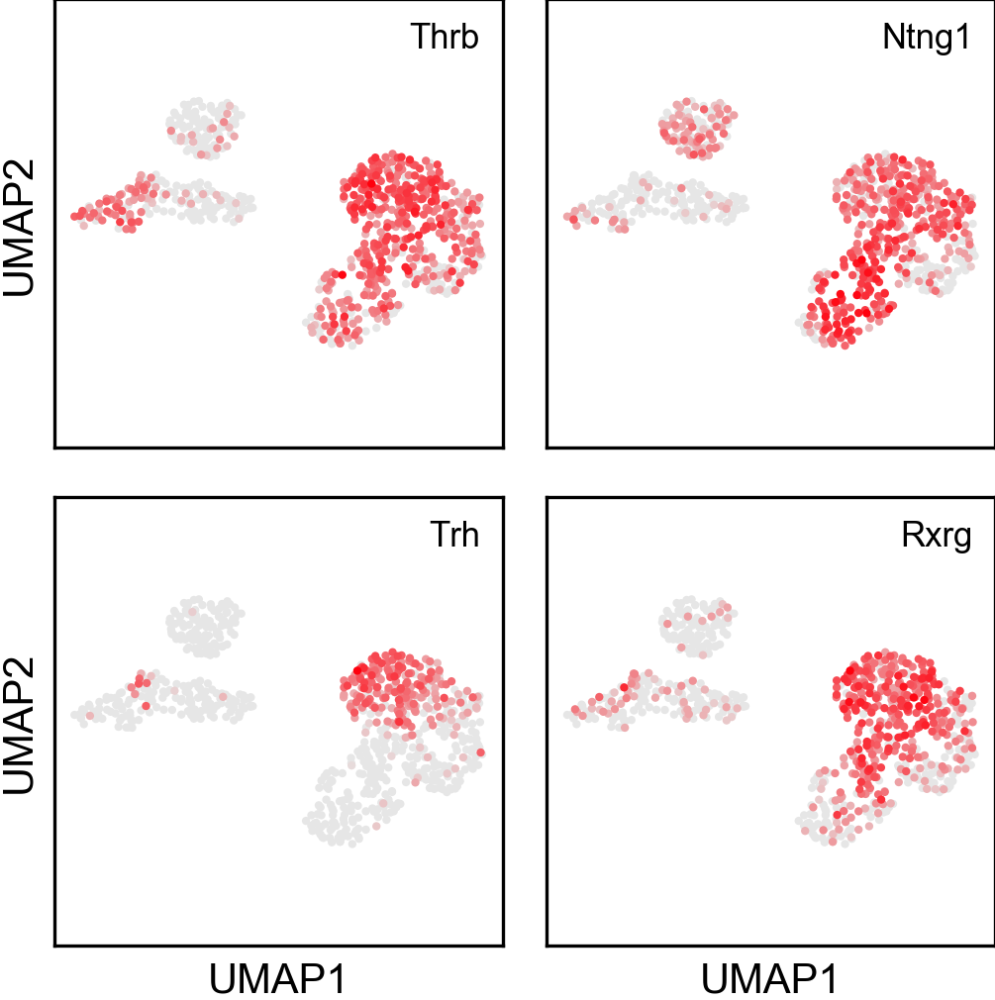

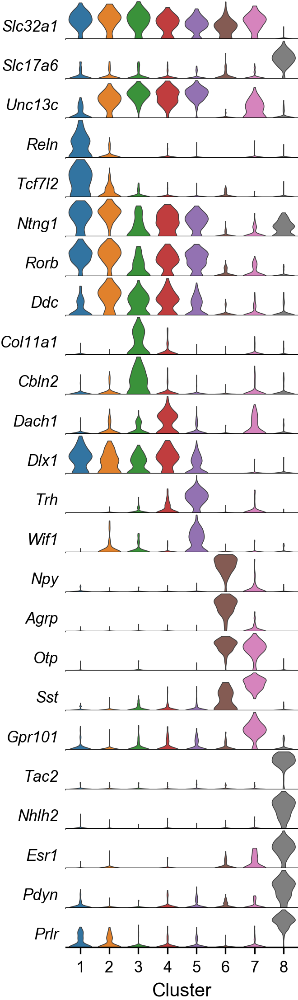

In [35]:
violin_genes = (
    "Slc32a1,Slc17a6,Unc13c,Reln,Tcf7l2,Ntng1,Rorb,Ddc,Col11a1,Cbln2,Dach1,Dlx1,Trh,"
    "Wif1,Npy,Agrp,Otp,Sst,Gpr101,Tac2,Nhlh2,Esr1,Pdyn,Prlr"
).split(",")
umap_genes = ("Agrp,Npy,Otp,Sst,Gpr101,Tac2,Pdyn,Esr1,Prlr,Kiss1,Unc13c,Foxp2,Thrb,Ntng1,Trh,Rxrg").split(",")

adata = arc_final
name = "ARC"
for k, genes in enumerate(grouper(umap_genes, 4), start=1):
    genes = list(filter(None, genes))
    scatter_2by2(
        adata, genes, figdir="revision", filename=f"marker_umap_{name}-{k}",
        markersize=16, add_marker_edges=False,
        label_ha="right"
    )
marker_violins(
    adata, violin_genes, "cluster", adata.uns["cluster_colors"],
    filename=f"marker_violins_{name}", figdir="revision"
)

## LHA (15, 19)

In [56]:
lha2 = neuronal_final[lha2.obs_names, :].copy()
lha2.obs = lha_final.obs.copy()
lha2.uns = lha_final.uns.copy()

Saved to marker_violins_LHA-Meis2.pdf


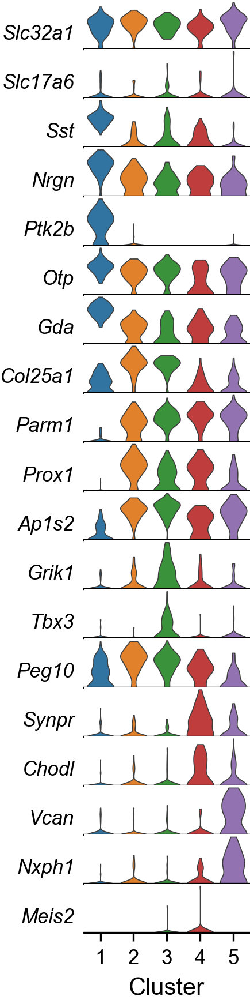

In [59]:
violin_genes2 = (
    "Slc32a1,Slc17a6,Sst,Nrgn,Ptk2b,Otp,Gda,Col25a1,Parm1,Prox1,Ap1s2,Grik1,Tbx3,Peg10,"
    "Synpr,Chodl,Vcan,Nxph1,Meis2"
).split(",")
marker_violins(
    lha2, violin_genes2, "cluster", lha2.uns["cluster_colors"],
    filename=f"marker_violins_LHA-Meis2", figdir="revision"
)

Saved to marker_umap_LHA-1.pdf
Saved to marker_umap_LHA-2.pdf
Saved to marker_violins_LHA.pdf


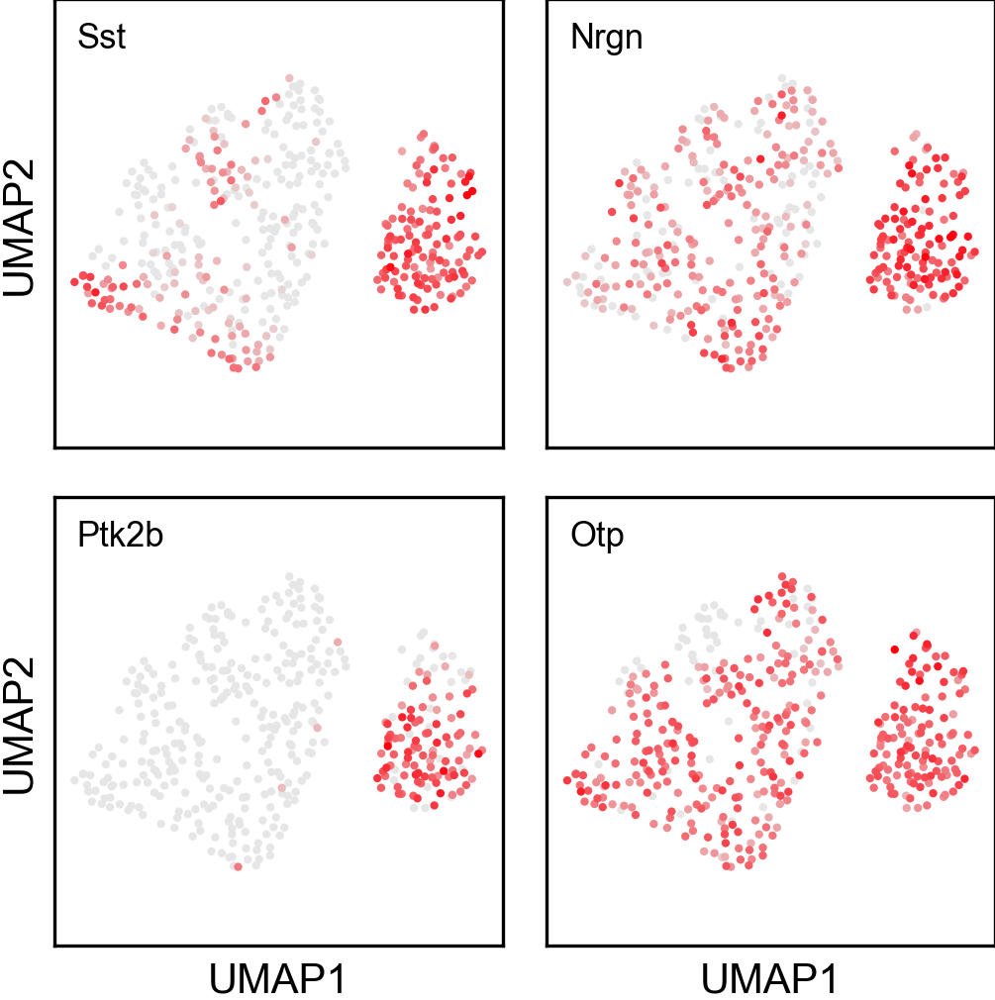

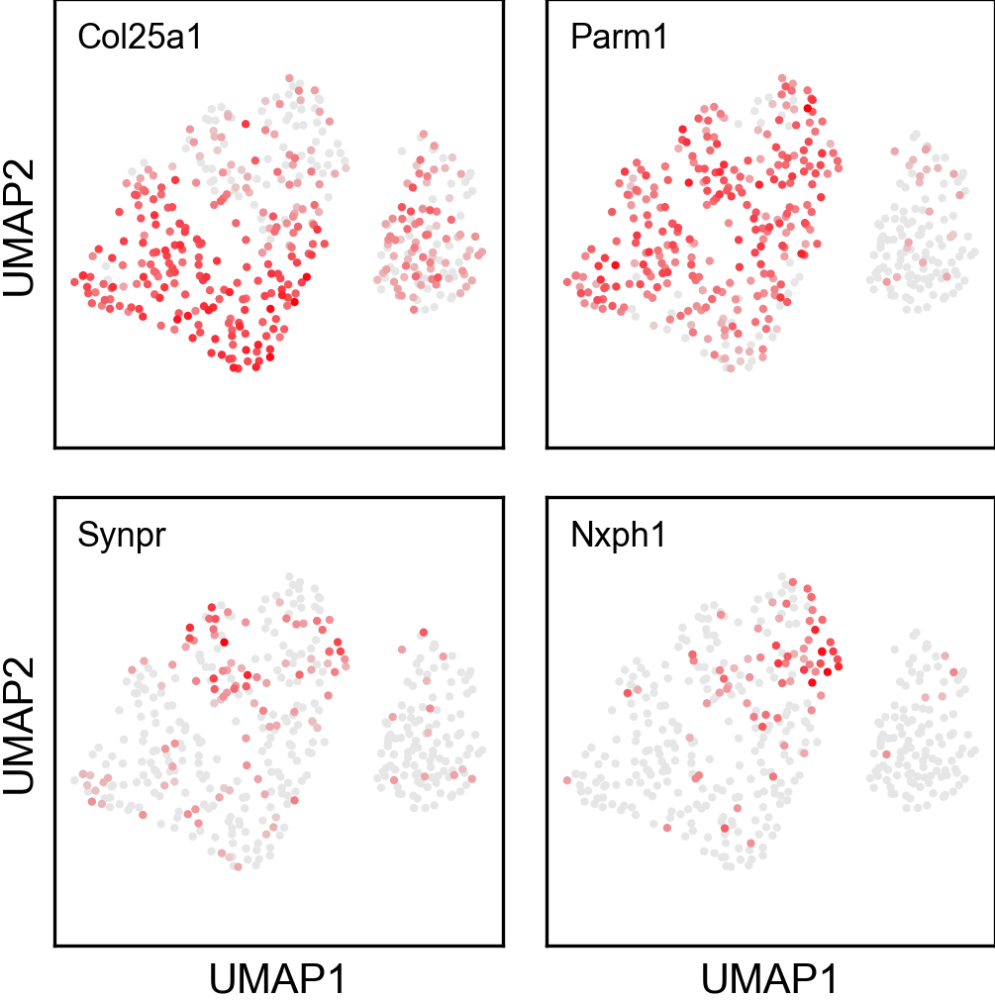

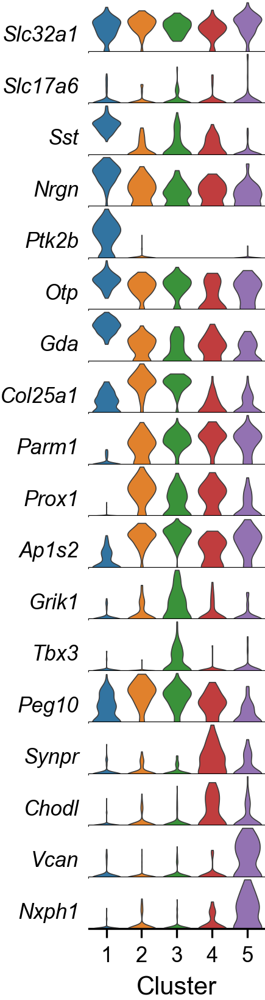

In [29]:
violin_genes = (
    "Slc32a1,Slc17a6,Sst,Nrgn,Ptk2b,Otp,Gda,Col25a1,Parm1,Prox1,Ap1s2,Grik1,Tbx3,Peg10,"
    "Synpr,Chodl,Vcan,Nxph1"
).split(",")
umap_genes = ("Sst,Nrgn,Ptk2b,Otp,Col25a1,Parm1,Synpr,Nxph1").split(",")

adata = lha_final
name = "LHA"
for k, genes in enumerate(grouper(umap_genes, 4), start=1):
    genes = list(filter(None, genes))
    scatter_2by2(
        adata, genes, figdir="revision", filename=f"marker_umap_{name}-{k}",
        markersize=16, add_marker_edges=False
    )
marker_violins(
    adata, violin_genes, "cluster", adata.uns["cluster_colors"],
    filename=f"marker_violins_{name}", figdir="revision"
)

## TMN (13, 17)

Saved to marker_umap_TMN-1.pdf
Saved to marker_umap_TMN-2.pdf
Saved to marker_umap_TMN-3.pdf
Saved to marker_violins_TMN.pdf


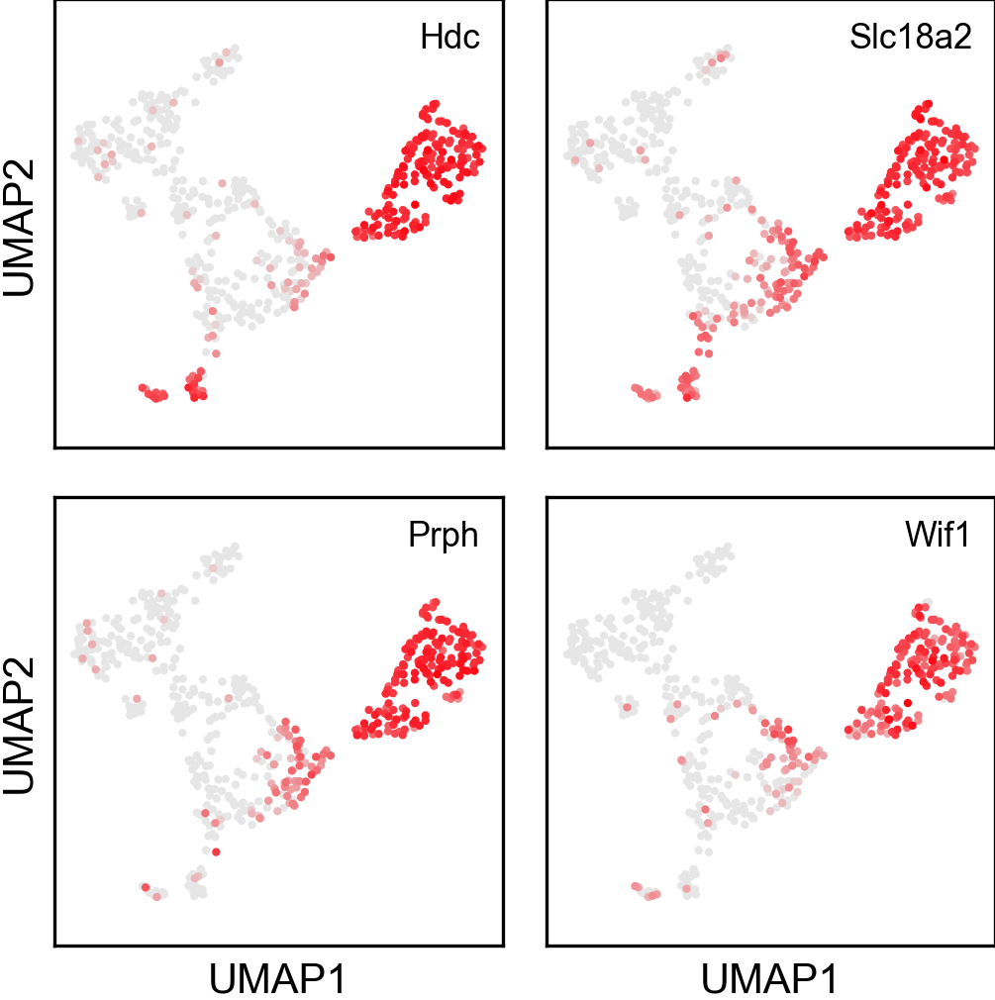

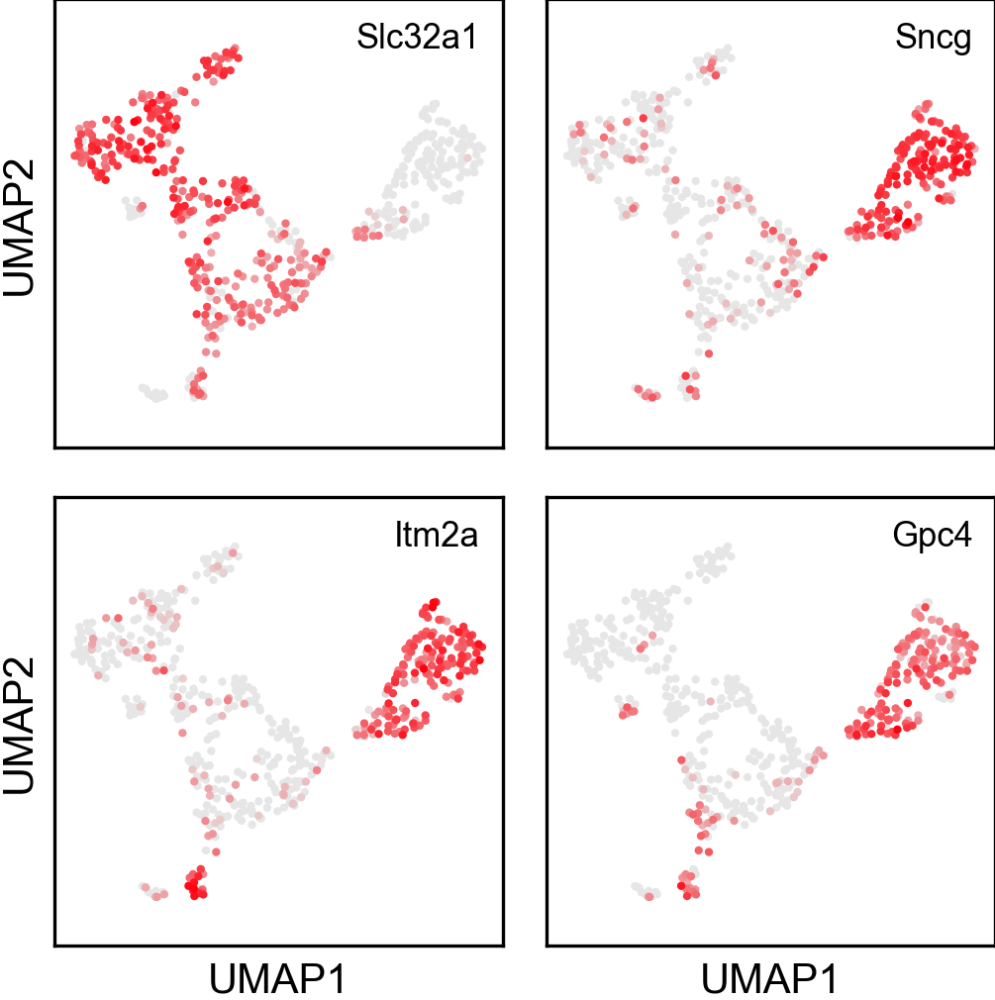

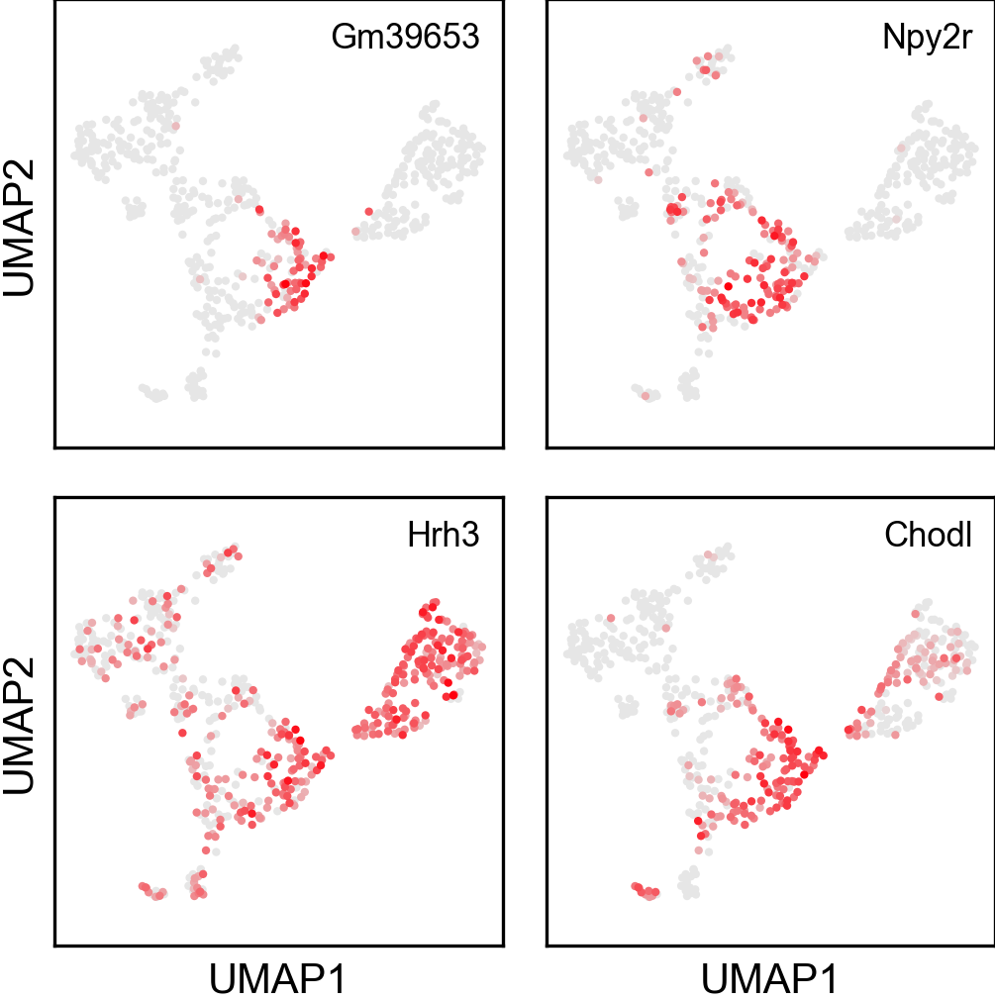

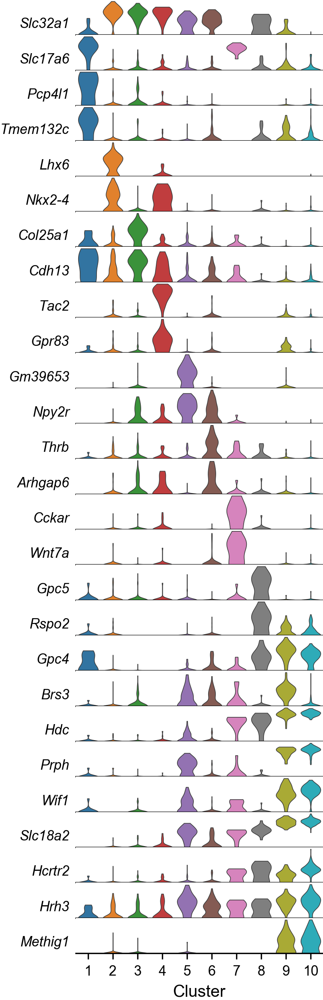

In [34]:
violin_genes = (
    "Slc32a1,Slc17a6,Pcp4l1,Tmem132c,Lhx6,Nkx2-4,Col25a1,Cdh13,Tac2,Gpr83,Gm39653,Npy2r,"
    "Thrb,Arhgap6,Cckar,Wnt7a,Gpc5,Rspo2,Gpc4,Brs3,Hdc,Prph,Wif1,Slc18a2,Hcrtr2,Hrh3,Methig1"
).split(",")
umap_genes = ("Hdc,Slc18a2,Prph,Wif1,Slc32a1,Sncg,Itm2a,Gpc4,Gm39653,Npy2r,Hrh3,Chodl").split(",")

adata = tmn_final
name = "TMN"
for k, genes in enumerate(grouper(umap_genes, 4), start=1):
    genes = list(filter(None, genes))
    scatter_2by2(
        adata, genes, figdir="revision", filename=f"marker_umap_{name}-{k}",
        markersize=16, add_marker_edges=False,
        label_ha="right"
    )
marker_violins(
    adata, violin_genes, "cluster", adata.uns["cluster_colors"],
    filename=f"marker_violins_{name}", figdir="revision"
)

## LM (20)

Saved to marker_umap_LM-1.pdf
Saved to marker_umap_LM-2.pdf
Saved to marker_violins_LM.pdf


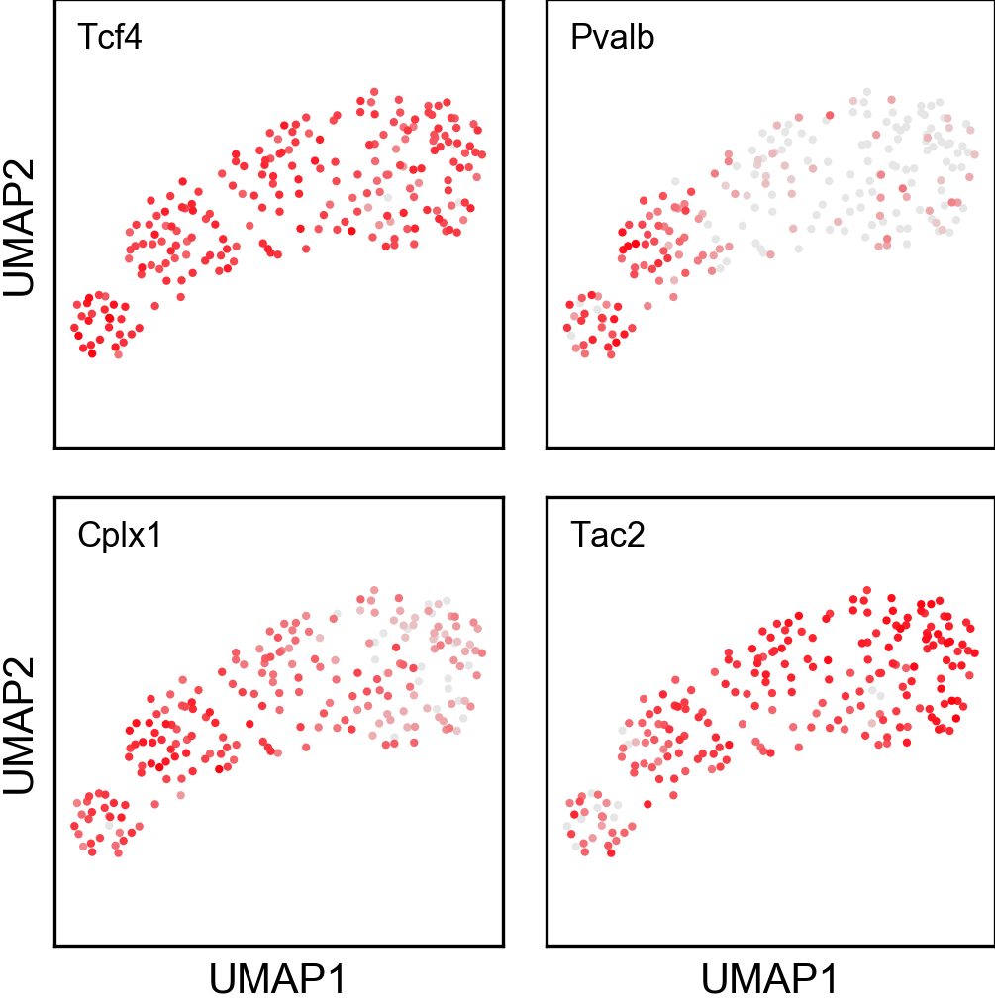

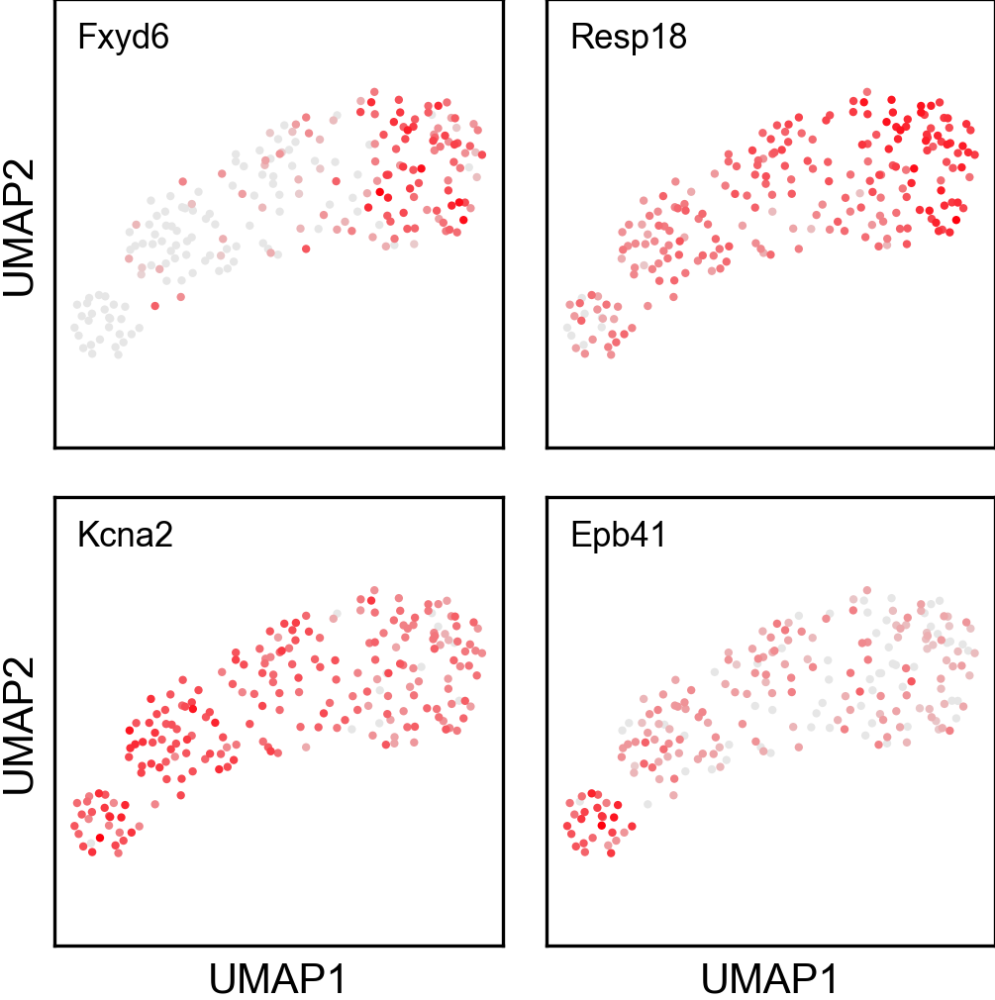

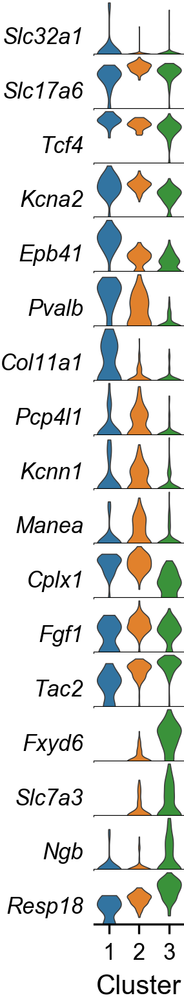

In [31]:
violin_genes = (
    "Slc32a1,Slc17a6,Tcf4,Kcna2,Epb41,Pvalb,Col11a1,Pcp4l1,Kcnn1,Manea,Cplx1,Fgf1,Tac2,Fxyd6,Slc7a3,Ngb,Resp18"
).split(",")
umap_genes = ("Tcf4,Pvalb,Cplx1,Tac2,Fxyd6,Resp18,Kcna2,Epb41").split(",")

adata = lm_final
name = "LM"
for k, genes in enumerate(grouper(umap_genes, 4), start=1):
    genes = list(filter(None, genes))
    scatter_2by2(
        adata, genes, figdir="revision", filename=f"marker_umap_{name}-{k}",
        markersize=16, add_marker_edges=False
    )
marker_violins(
    adata, violin_genes, "cluster", adata.uns["cluster_colors"],
    filename=f"marker_violins_{name}", figdir="revision"
)

## MM (1-5)

Saved to marker_umap_MM-1.pdf
Saved to marker_umap_MM-2.pdf
Saved to marker_umap_MM-3.pdf
Saved to marker_umap_MM-4.pdf
Saved to marker_violins_MM.pdf


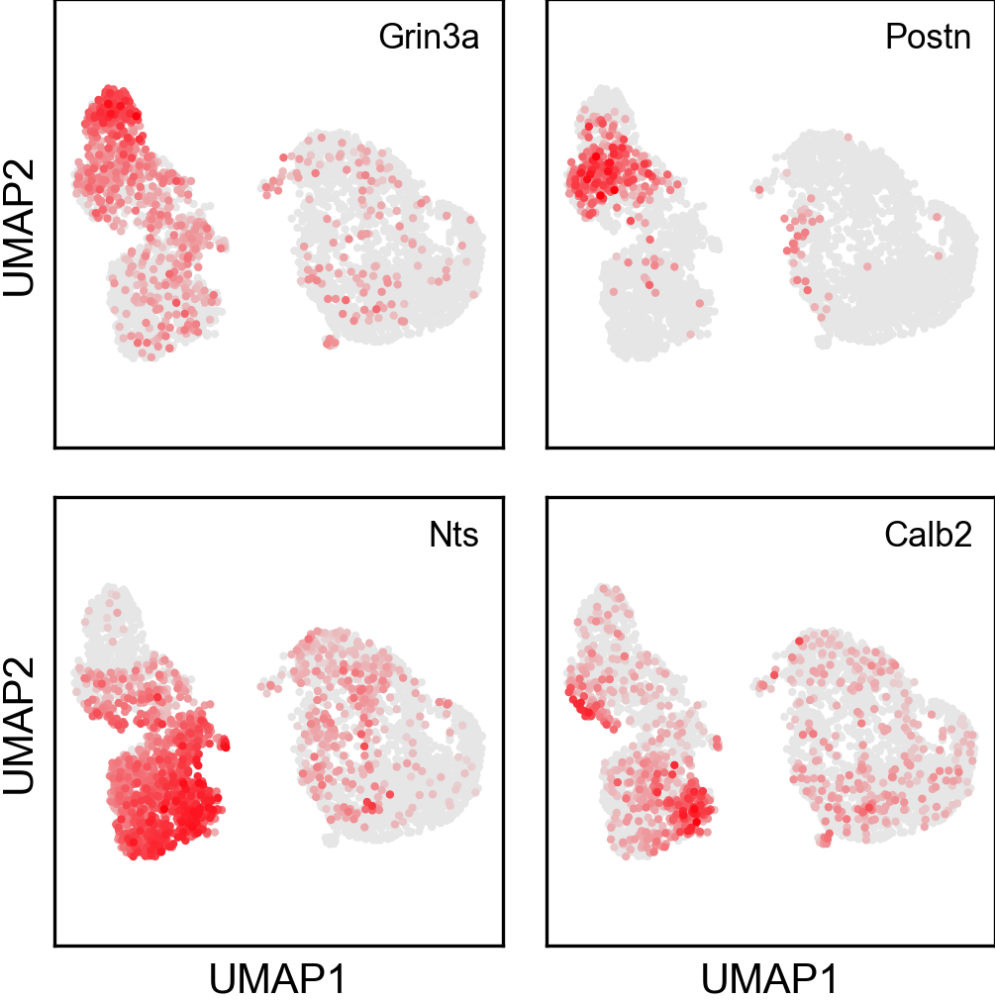

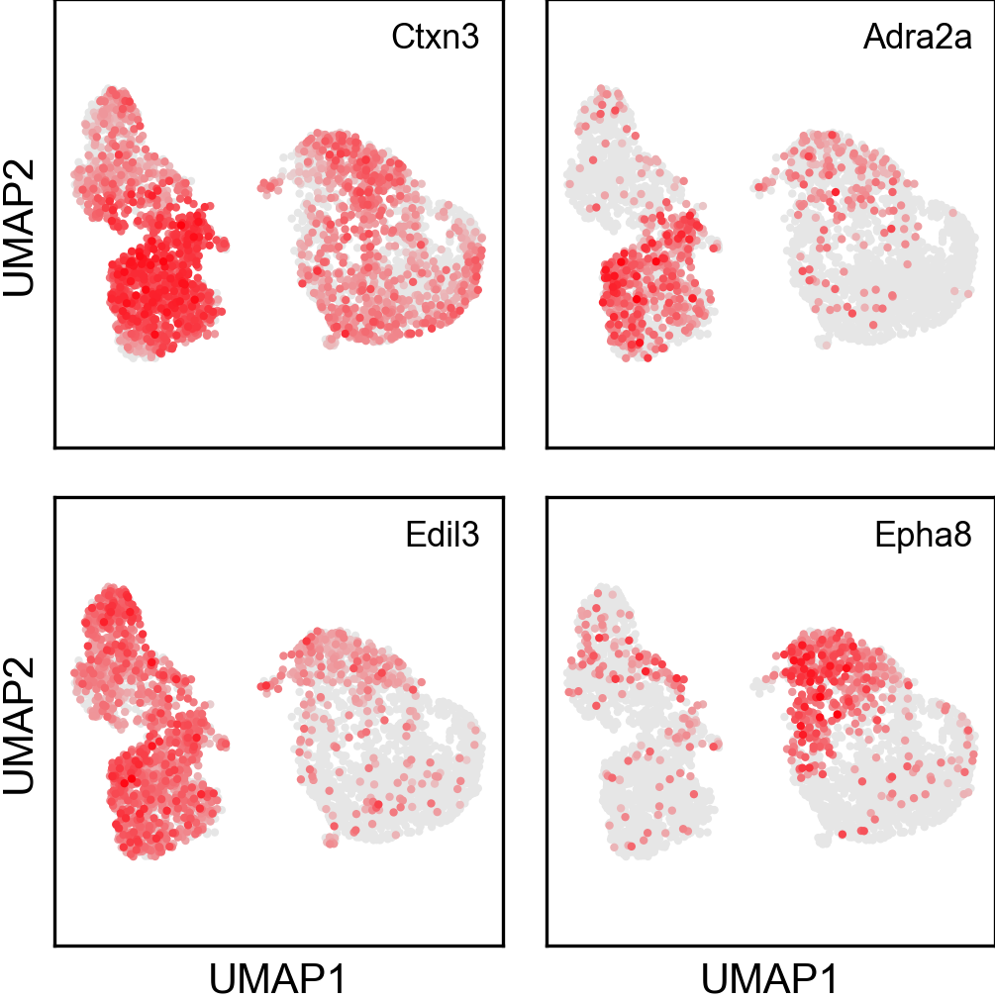

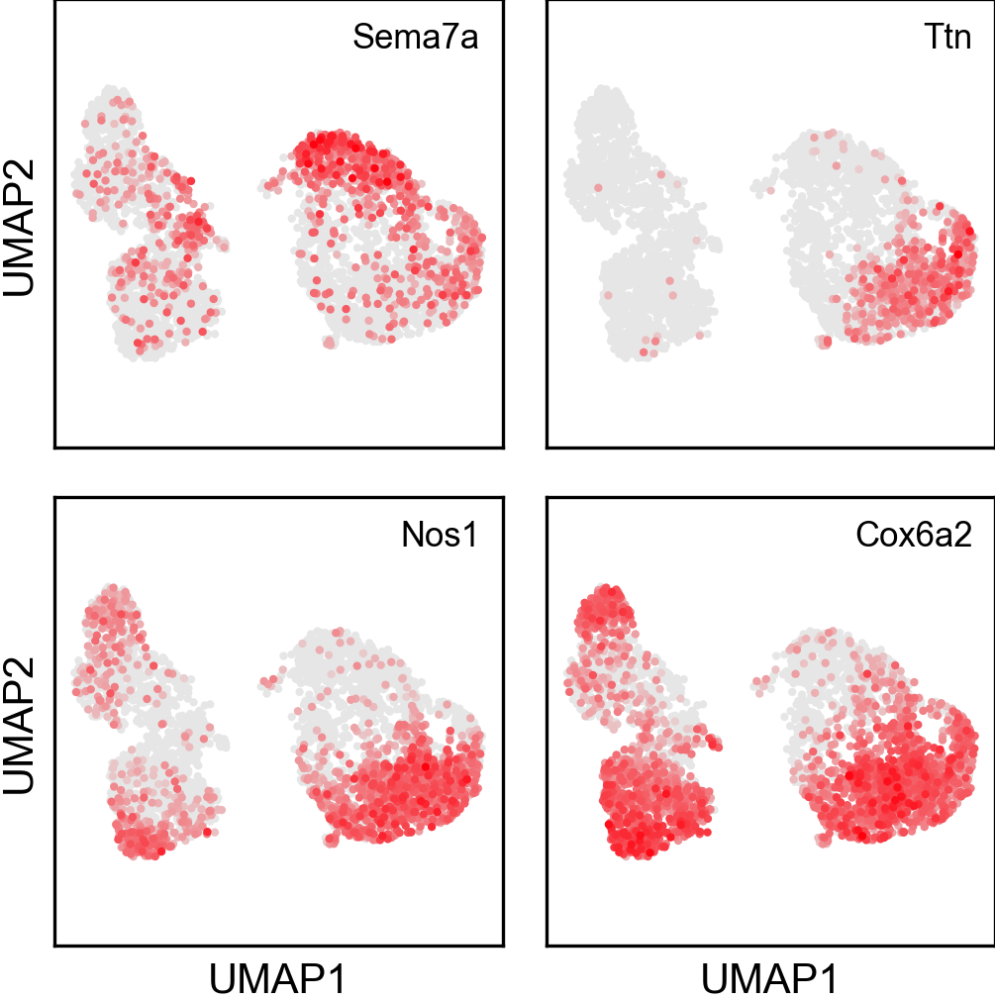

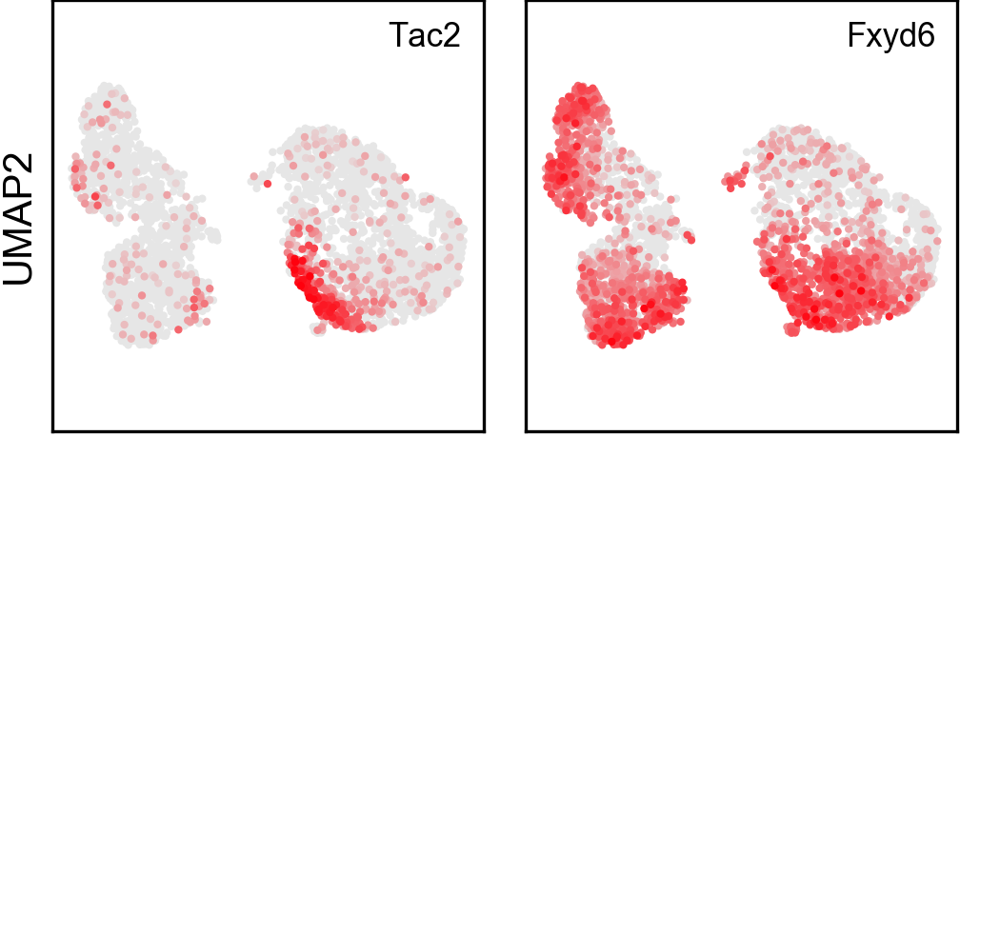

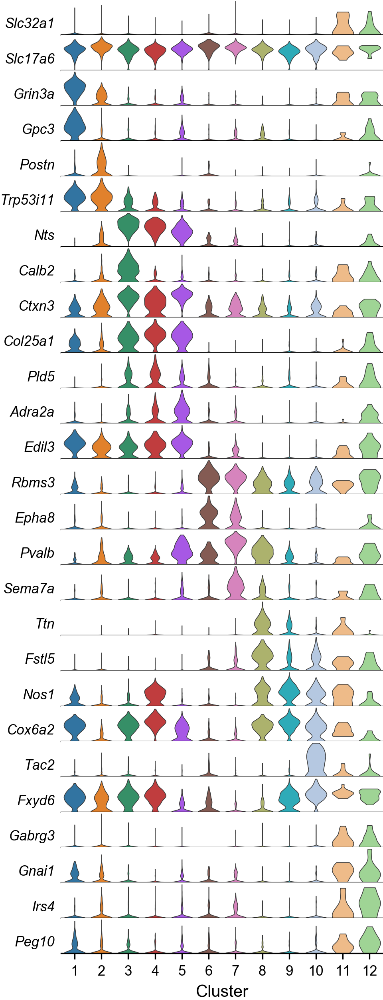

In [33]:
violin_genes = (
    "Slc32a1,Slc17a6,Grin3a,Gpc3,Postn,Trp53i11,Nts,Calb2,Ctxn3,Col25a1,Pld5,Adra2a,Edil3,"
    "Rbms3,Epha8,Pvalb,Sema7a,Ttn,Fstl5,Nos1,Cox6a2,Tac2,Fxyd6,Gabrg3,Gnai1,Irs4,Peg10"

).split(",")
umap_genes = ("Grin3a,Postn,Nts,Calb2,Ctxn3,Adra2a,Edil3,Epha8,Sema7a,Ttn,Nos1,Cox6a2,Tac2,Fxyd6").split(",")

adata = mm_final
name = "MM"
for k, genes in enumerate(grouper(umap_genes, 4), start=1):
    genes = list(filter(None, genes))
    scatter_2by2(
        adata, genes, figdir="revision", filename=f"marker_umap_{name}-{k}",
        markersize=16, add_marker_edges=False,
        label_ha="right"
    )
marker_violins(
    adata, violin_genes, "cluster", adata.uns["cluster_colors"],
    filename=f"marker_violins_{name}", figdir="revision"
)

## SUM (8)

In [27]:
sum_final.obs["cluster"] = sum_final.obs["cluster_revised"].copy()
sum_final.uns["sampleid"] = "aggr_sum"
#sum_final.uns["cluster_colors"] = sum_final.uns["cluster_revised_colors"].copy()

In [20]:
find_marker_genes(sum_final, log_fold_change=0.5);

1 2 3 4 5 6 

In [33]:
get_marker_dataframe(sum_final).groupby("cluster").head(2).gene_name.values

array(['Cpne4', 'Tspan7', 'Crhbp', 'Rgs10', 'Slc1a2', 'Slc32a1',
       '1500009L16Rik', 'Cd24a', 'Nos1', 'Nfix', 'Tle4', 'Nfix'],
      dtype=object)

In [30]:
sum_final.uns["cluster_colors"]

array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'],
      dtype='<U7')

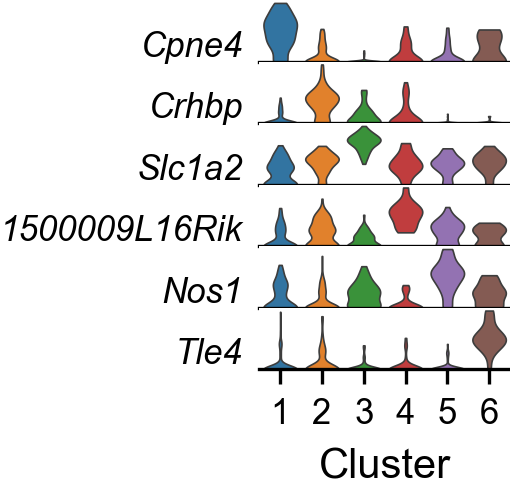

In [34]:
marker_violins(
    sum_final, 
    get_marker_dataframe(sum_final).groupby("cluster").head(1).gene_name.values, 
    "cluster", sum_final.uns["cluster_colors"],
    #filename=f"marker_violins_{name}", figdir="revision"
)

In [23]:
get_marker_dataframe(sum_final).groupby("cluster").head(10).gene_name

0              Cpne4
1             Tspan7
2               Tpbg
3             Arpp21
4               Rprm
5              Ntng1
6              Calb1
7              Opcml
8             Bcl11b
9              Fras1
104            Crhbp
105            Rgs10
106          Pcdh11x
107           Plagl1
108            Lbhd2
109             Sdc2
110           Vstm2a
111           Sphkap
112            Kctd8
113             Egr1
140           Slc1a2
141          Slc32a1
142             Etl4
143            Cadm2
144           Slc6a1
145           Sema3c
146           Clstn2
147           Elavl4
148            Ndrg4
149            Inhba
332    1500009L16Rik
333            Cd24a
334             Nnat
335            Cpne7
336            Calca
337          Tmem158
338            Lypd1
339            Kctd4
340          Fam210b
341             Car4
399             Nos1
400             Nfix
401             Nfib
402             Nfia
403            Nxph4
404           Hs6st2
405            C1ql1
406          

# Side by side clustering

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if __name__ == '__main__':
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if __name__ == '__main__':
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if __name__ == '__main__':
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if __name__ == '__main__':
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

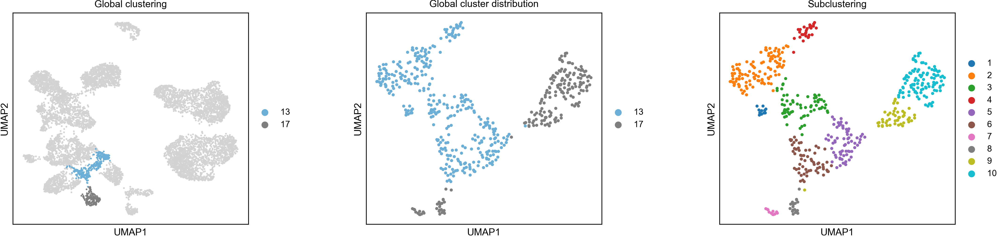

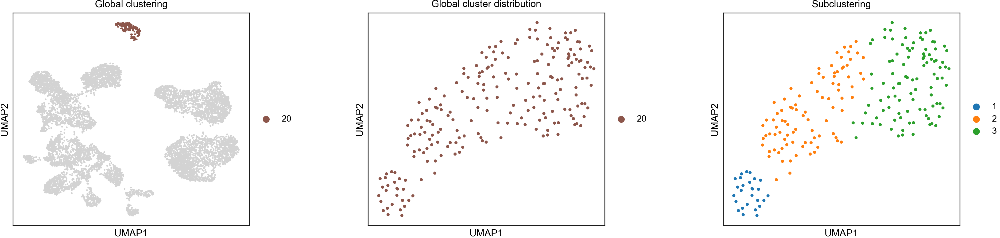

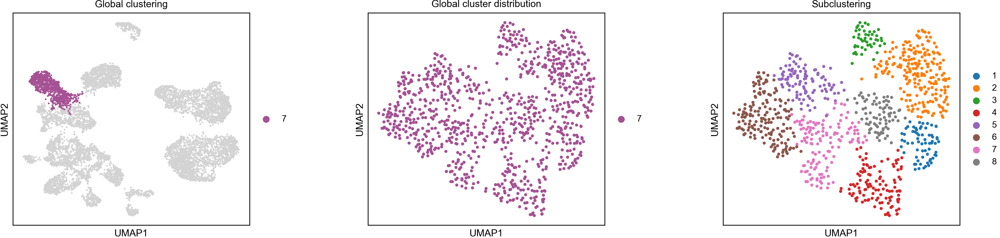

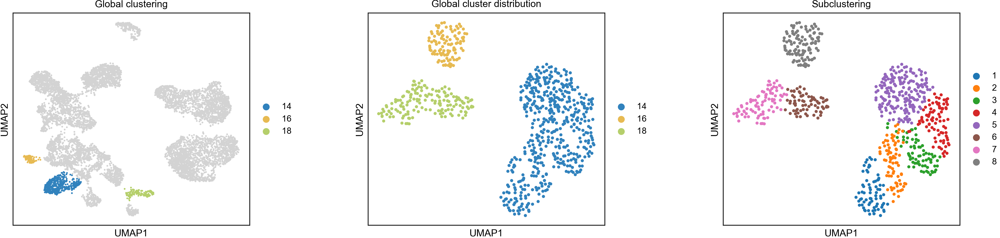

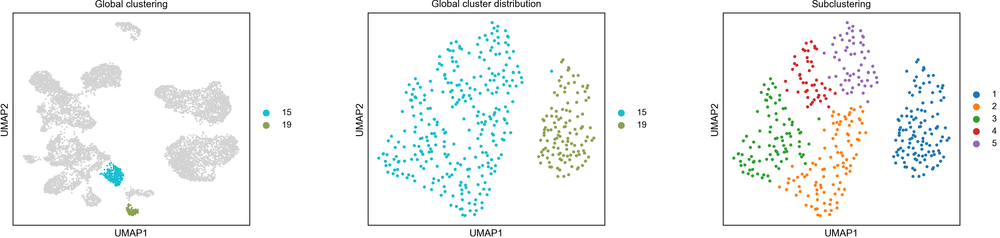

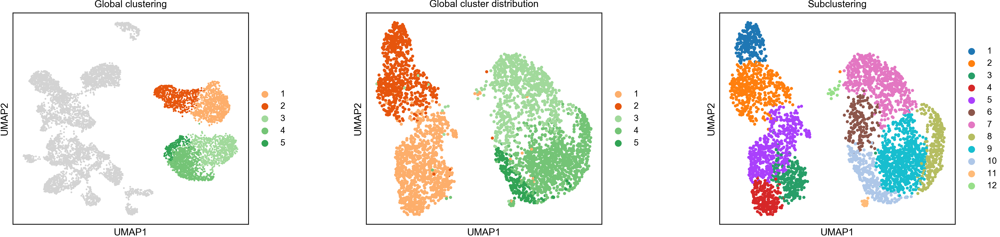

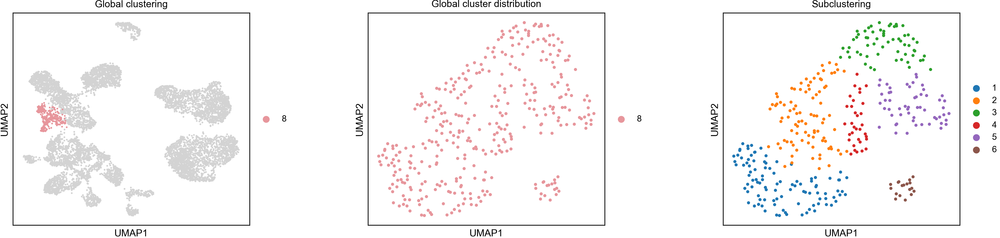

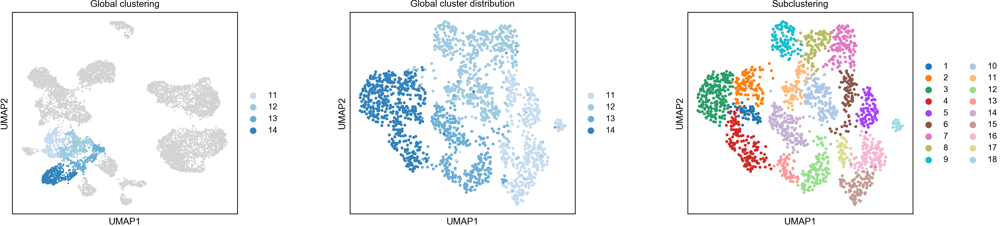

In [25]:
for ad in (
    tmn_final, lm_final,
    pmn_final,
    arc_final, lha_final,
    mm_final, sum_final,
    unknown_final,
):
    fig = plot_side_by_side(neuronal_final, ad)
    fig.tight_layout()
    fig.savefig(f"../figures/revision/{ad.uns['sampleid']}_side-by-side_clustering.pdf")

## Heatmaps

Saved to aggr_sum_heatmap-v1.png


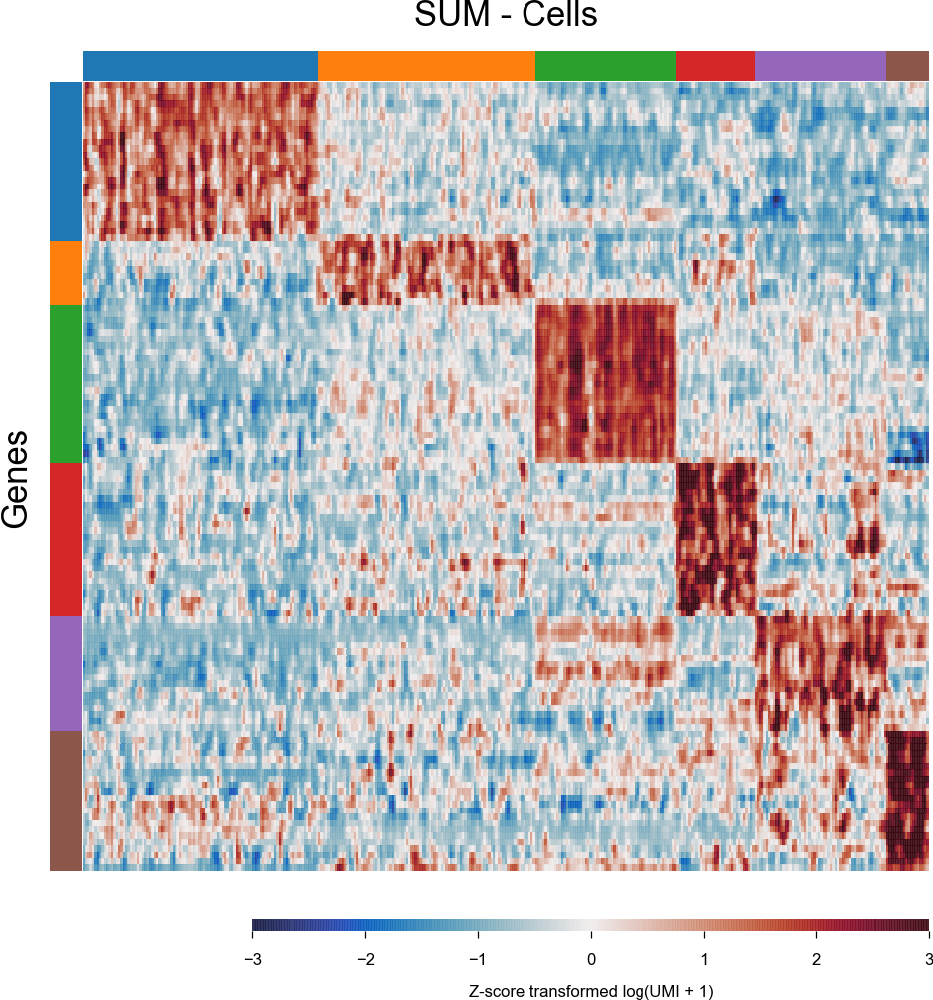

<Figure size 30x30 with 0 Axes>

In [47]:
plot_heatmap(sum_final, "SUM")

In [50]:
adatas = tmn_final, lm_final, pmn_final, arc_final, lha_final, mm_final
names = "TMN", "LM", "PMNv", "ARC", "LHA", "MM"

Saved to aggr_tmn_like_heatmap-v1.png
Saved to aggr_lm_heatmap-v1.png
Saved to aggr_pmn_heatmap-v1.png
Saved to aggr_arc_heatmap-v1.png
Saved to aggr_lha_heatmap-v1.png
Saved to aggr_mm_heatmap-v1.png


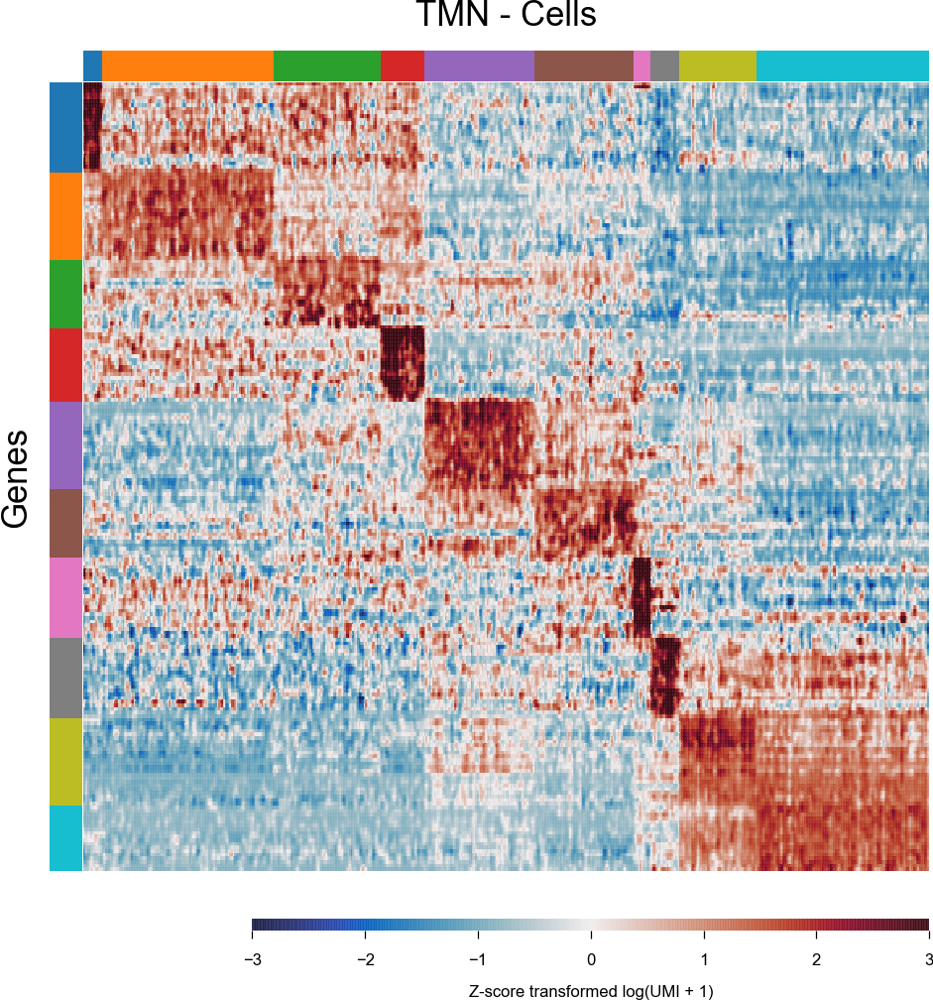

<Figure size 30x30 with 0 Axes>

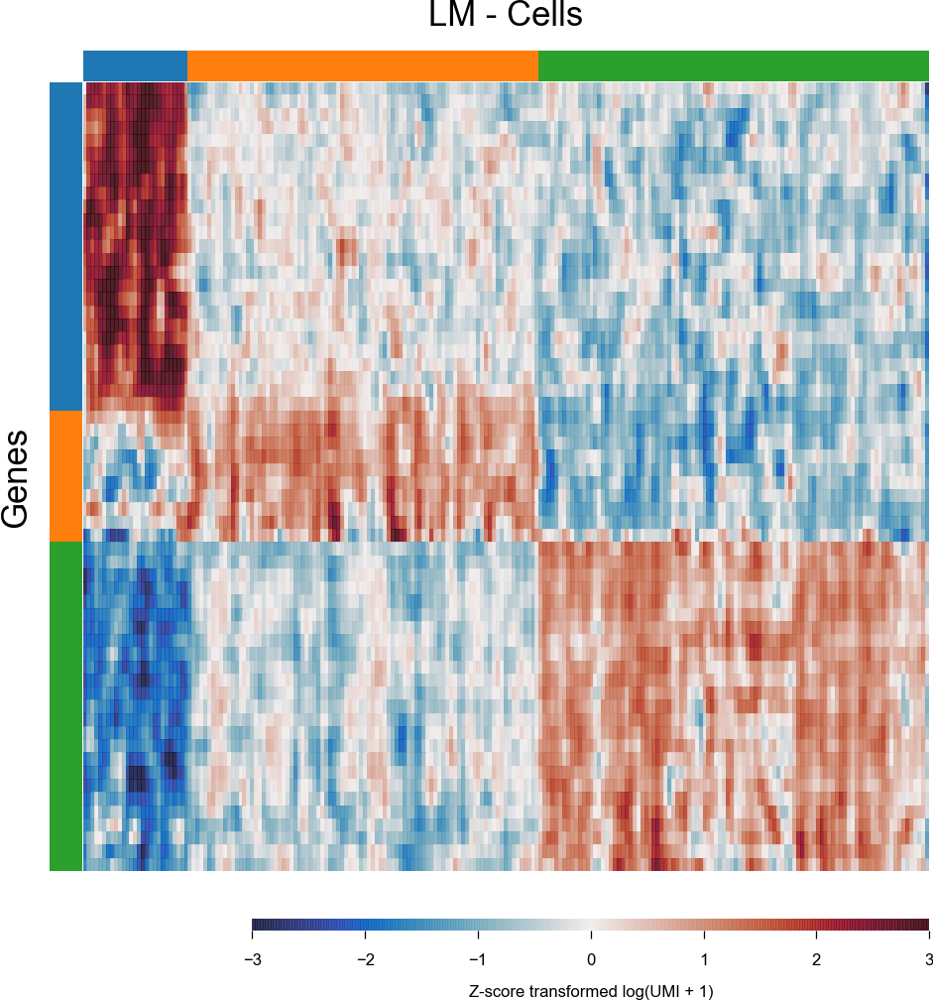

<Figure size 30x30 with 0 Axes>

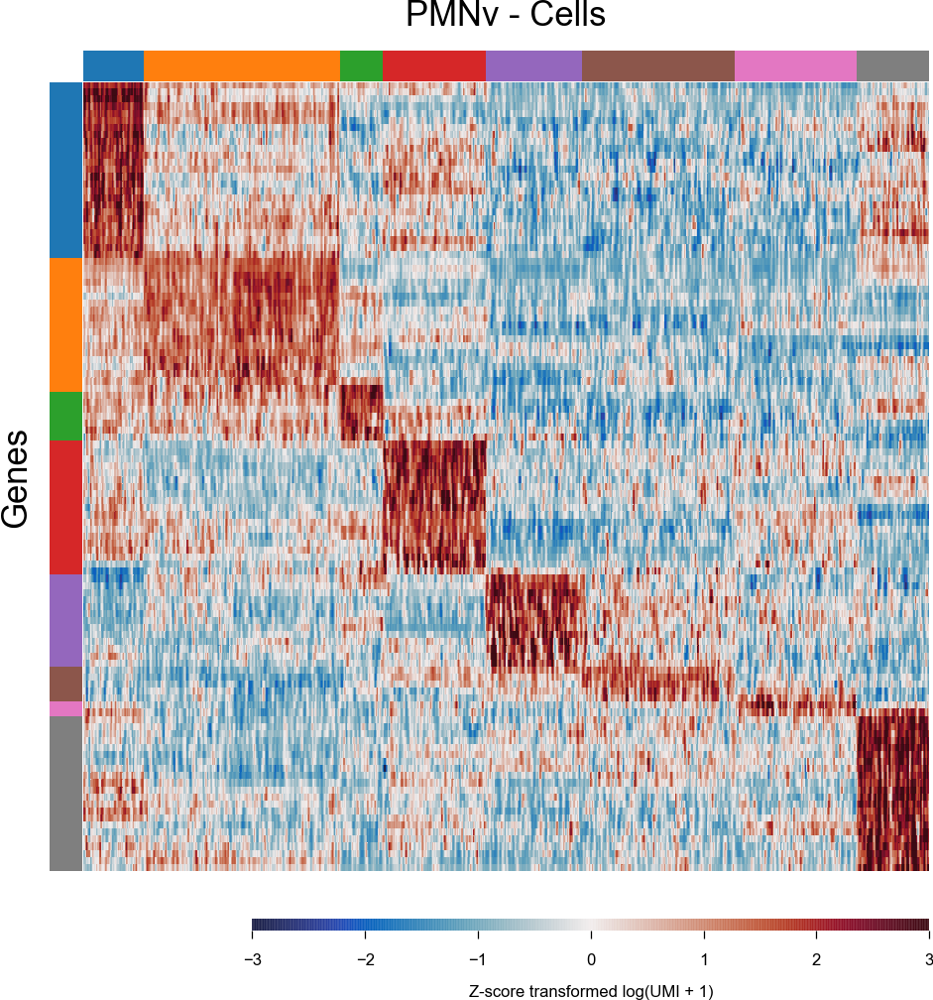

<Figure size 30x30 with 0 Axes>

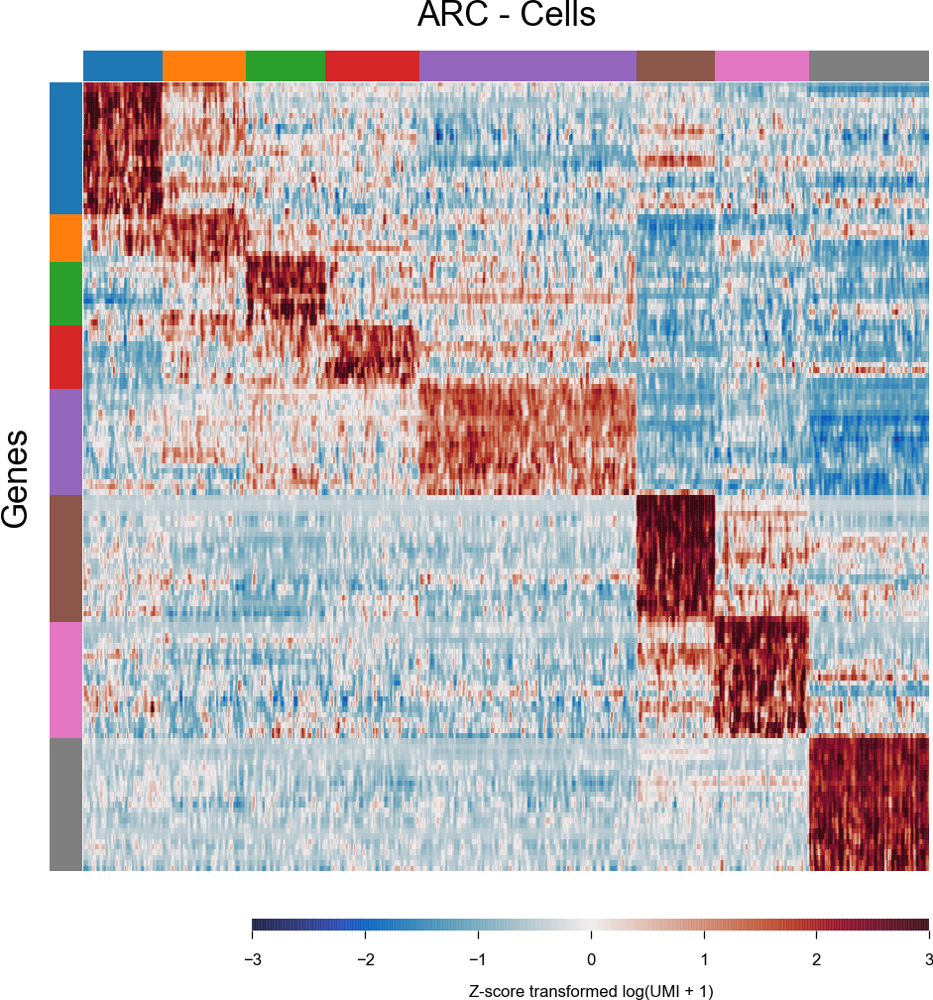

<Figure size 30x30 with 0 Axes>

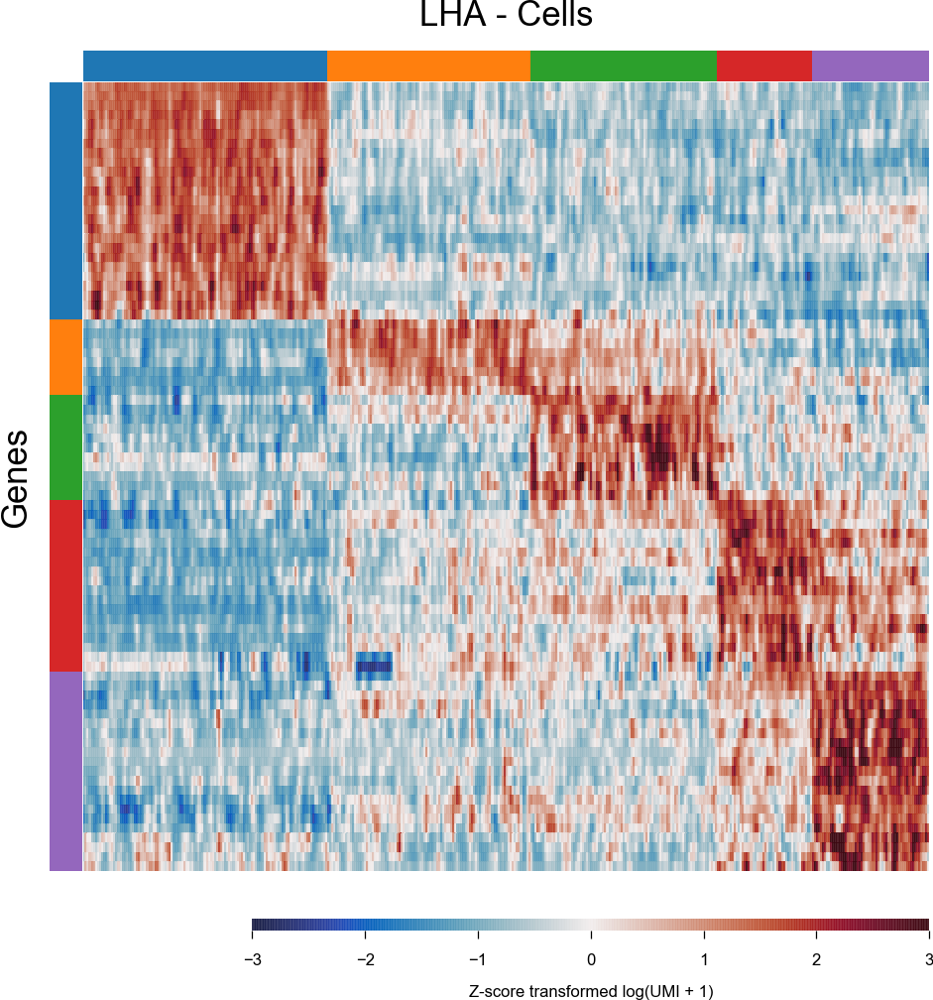

<Figure size 30x30 with 0 Axes>

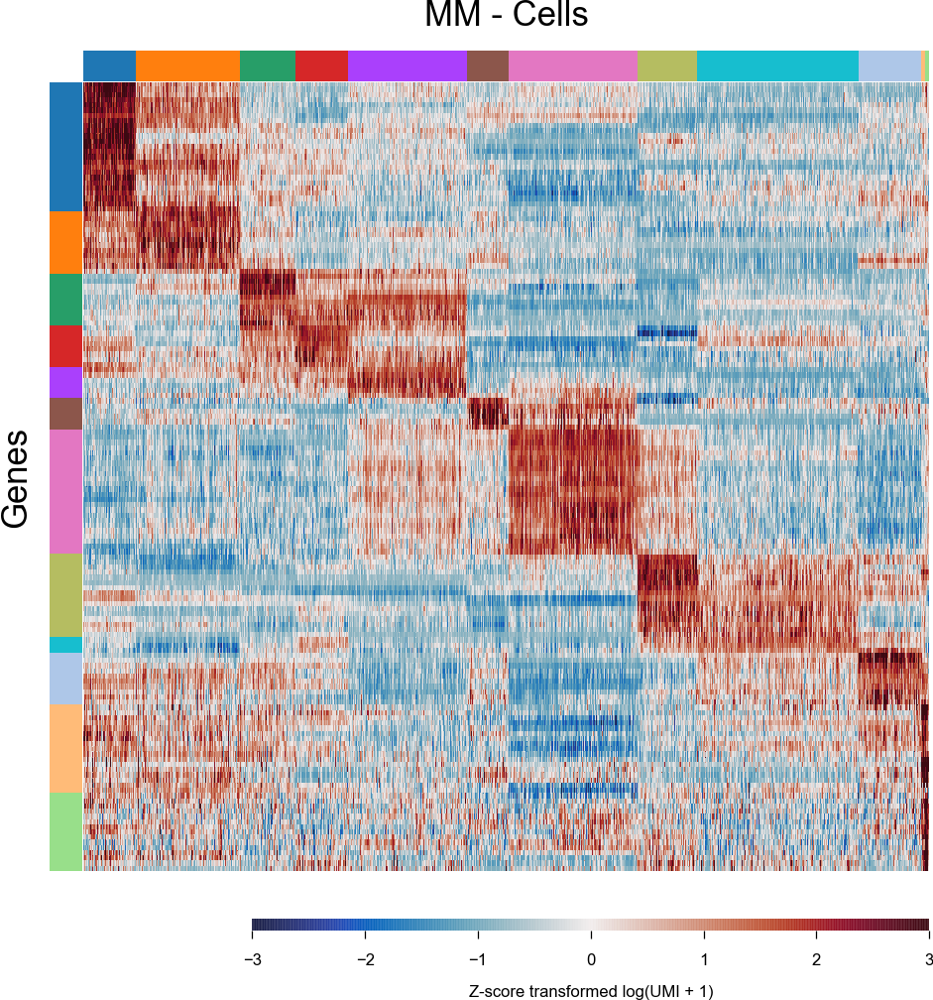

<Figure size 30x30 with 0 Axes>

In [51]:
for ad, name in zip(adatas, names):
    c = plot_heatmap(ad, name)